# Auswirkungen von variierenden Abstufungen von Helligkeit, Kontrast und Saturation auf die wahrgenommene Ästhetik verschiedener Bilder von Sonnenuntergängen & Auswirkungen von unterschiedlichen Rating-Skalen auf die Bewertung des selben Bildes

## Matti Zinke, Christian Wohlhaupt, Bozhidar Rusev, Iliya Velev

### Seminar: Visuelle Wahrnehmung beim Menschen und Bildqualität - WiSe 2020/21

_Wir beziehen uns des öfteren auf den ersten bzw. zweiten Teil des Projekts. Der erste Teil ist der mit variierenden Abstufungen von Helligkeit, Kontrast und Saturation. Der zweite Teil ist der mit den unterschiedlichen Bewertungsskalen._

Eine Liste mit allen benutzten Bibliotheken und Packages

In [8]:
#Zur Erstellung des veränderten Bildmaterials
from PIL import Image, ImageEnhance

import matplotlib.pyplot as plt
from matplotlib.pyplot import imshow
import numpy as np
import math
%matplotlib inline

import os
import errno

#Weitere Imports zur Datenauswertung des ersten Teils (mit Plots)
import re
from os import listdir
from os.path import isfile, join
import seaborn as sns

#Weitere Imports für die Datenauswertung des ersten Teils mit Heatmaps
import csv
import pandas as pd
from pandas import Series,DataFrame
import glob


In [9]:
#Dieser Import ist nur um Plotting Funktionen schnell und übersichtlich hier einbringen zu können
import Datenauswertungsfunktionen as daf

In [10]:
#open all csv files for skalas
path =r'.\data_scales'
filenames = glob.glob(path + "/*.csv")
df = pd.concat(map(pd.read_csv, filenames))

## 1. Einleitung

Sonnenuntergänge werden allgemein als ein *schönes* Naturphänomen angesehen. Aber was macht diese *Schönheit* auf einem Bild eines Sonnenuntergangs aus? Eigenschaften wie Helligkeit, Kontrast und Saturation sind allzu bekannt und haben eine hohe Auswirkung auf die *Schönheit* eines Bildes für einen Betrachter. Verändern wir diese Eigenschaften (durch Intensivierung oder Abschwächung) beobachten wir eine entsprechende Änderung der wahrgenommenen Ästhetik. Wir versuchen diese subjektiv wahrgenommene Ästhetik zu bemessen. Für unser Projekt kamen somit zwei **wissenschaftliche Fragestellungen** in Betracht:
1. Welchen Effekt haben Helligkeit, Kontrast und Saturation jeweils auf die wahrgenommene Ästhetik eines Bildes von einem Sonnenuntergang?
2. Welchen Effekt hat die Wahl der Skala auf die Bewertung der Ästhetik eines Bildes von einem Sonnenuntergang?

Um das zu schaffen haben wir paarweise Bildvergleiche auf unseren Bilddaten, sowie eine Skalenbewertung vereinzelnter Bilder durchgeführt.
Folgende **Hypothesen** haben wir untersucht:
1. Kontrast und Saturation sollten eine höhere wahrgenommene Ästhetik als Helligkeit bewirken.
2. Die Ergebnisse nähern sich einer optimalen Abstufung (je Eigenschaft) an.
3. Eine negative Saturation bewirkt eine niedriger wahrgenommene Ästhetik.
4. Man tendiert auf bekannten Bewertungsskalen strenger zu bewerten.

## 2. Experimentelles Design

### Teil 1
Im ersten Teil haben wir mit 6 selbstgemachten Bildern von Sonnenuntergängen gearbeitet. Für jedes Bild haben wir pro Eigenschaft (Helligkeit, Kontrast, Saturation) jeweils 6 Abstufungen ausgewählt und untereinander verglichen. Die Werte beschreiben den Multiplikationsfaktor, welcher im Funktionsaufruf der _PIL_-Bibliothek für die jeweilige Eigenschaft übergeben wird. Der Wert 1 steht somit für das Originalbild. Der Wert 0.5 bei Helligkeit würde also bedeuten _"die Hälfte der Helligkeit des Originalbildes"_. Die Werte für die wir uns entschieden haben sind:
* Helligkeit: 0.7, 0.85, 1, 1.15, 1.3, 1.45
* Kontrast: 0.7, 0.85, 1, 1.15, 1.3, 1.45
* Saturation: 0.75, 0.9, 1, 1.2, 1.4, 1.6

_Bemerkung:_ Bei der Saturation gibt es keine gleichmäßigen Schritte. Das liegt daran, dass wir nach ausgiebigem Testen beobachtet haben, dass gleichmäßige Schritte bei der Saturation zu große bzw. zu kleine Unterschiede ausmachen, die für das menschliche Auge und die Ästhetik zu extrem bzw. unerkennbar sind.

### Teil 2
Im zweiten Teil des Experiments haben wir Bild 2 und Bild 6 verwendet. Dort haben wir die Bilder ästhetisch mit folgenden Messkalen bewertet (schlechteste Bewertung - beste Bewertung):
* Nominalskala: 1 bis 10
* Ordinalskala: sehr schlecht - schlecht - mittel - gut - sehr gut
* Schulnotenskala: 6 bis 1+
* Nominalskala: 1 bis 50

Bild 2 und 6 wurden immer abwechselnd gezeigt und hatten paarweise die selbe Ausprägung. Die Reihenfolge in dem diese Ausprägungen gezeigt wurden unterscheidet sich immer für br, con und sat. Zur Auswahl der Bewertung gab es für die Skalen 1 bis 10, sehr schlecht bis sehr gut und 1+ bis 6 Buttons zur schnellen Auswahl, für die Skale 1 bis 50 einen Schieberegler für eine bessere Übersichtlichkeit. Die Buttons für die Bewertung des Bildes waren dabei direkt links neben dem gezeigten Bild.


Die folgende Abbildung zeigt alle im ersten Teil verwendete Stimuli. Hierbei steht **br** für Helligkeit, **con** für Kontrast und **sat** für Saturation. Die Bilder sind von 1 bis 6 durchnummeriert.

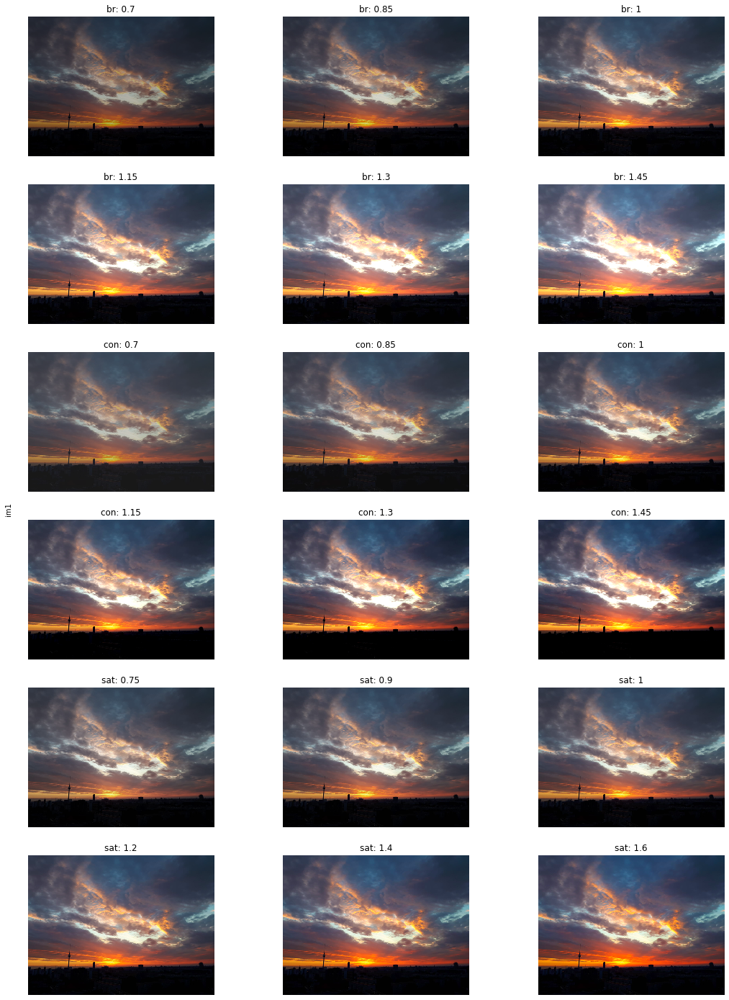

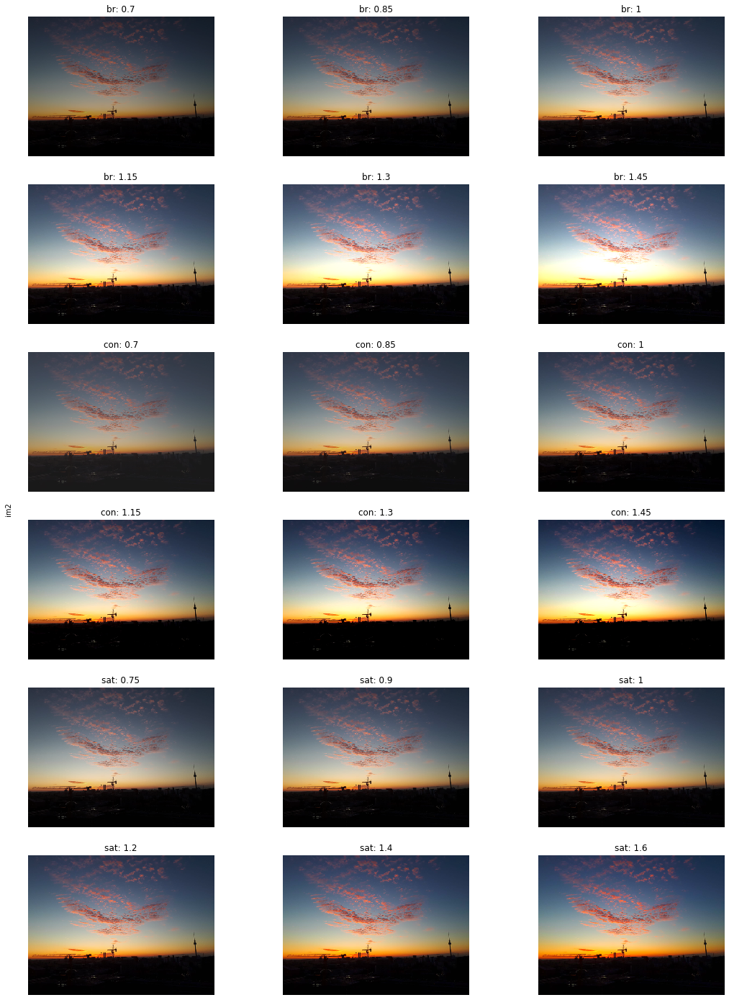

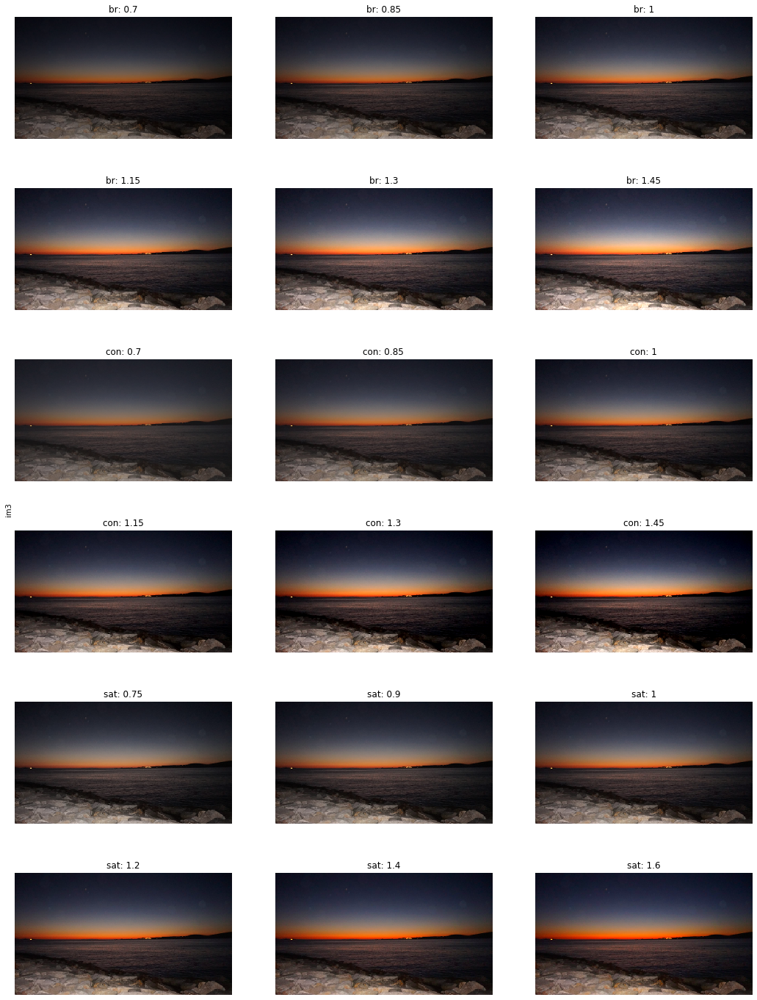

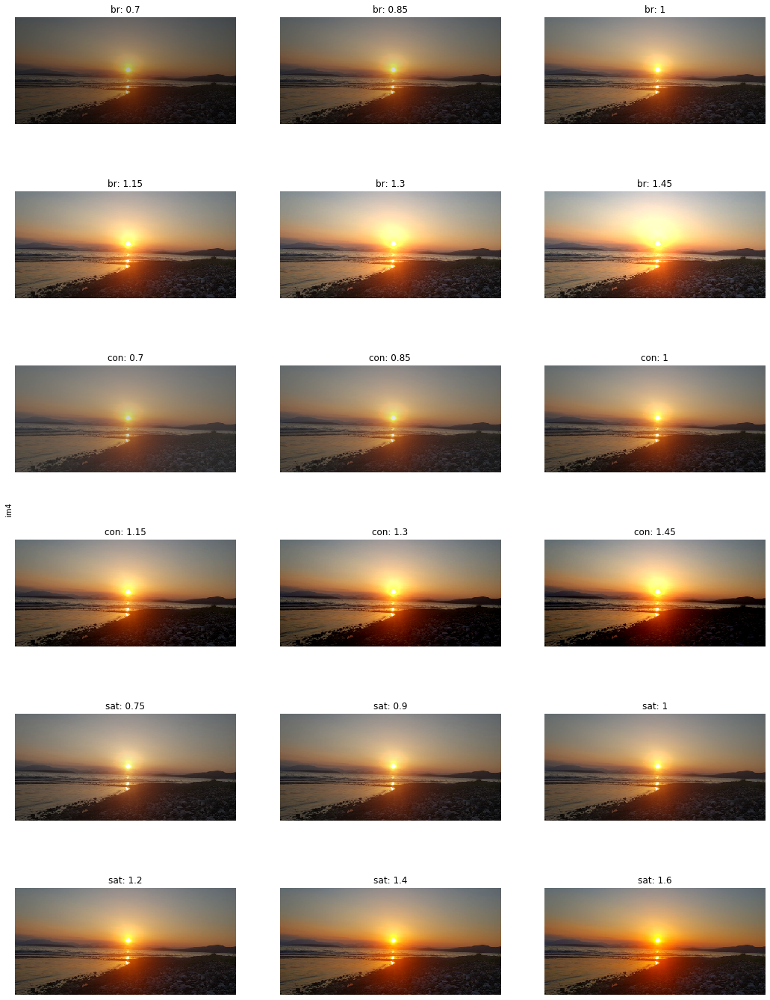

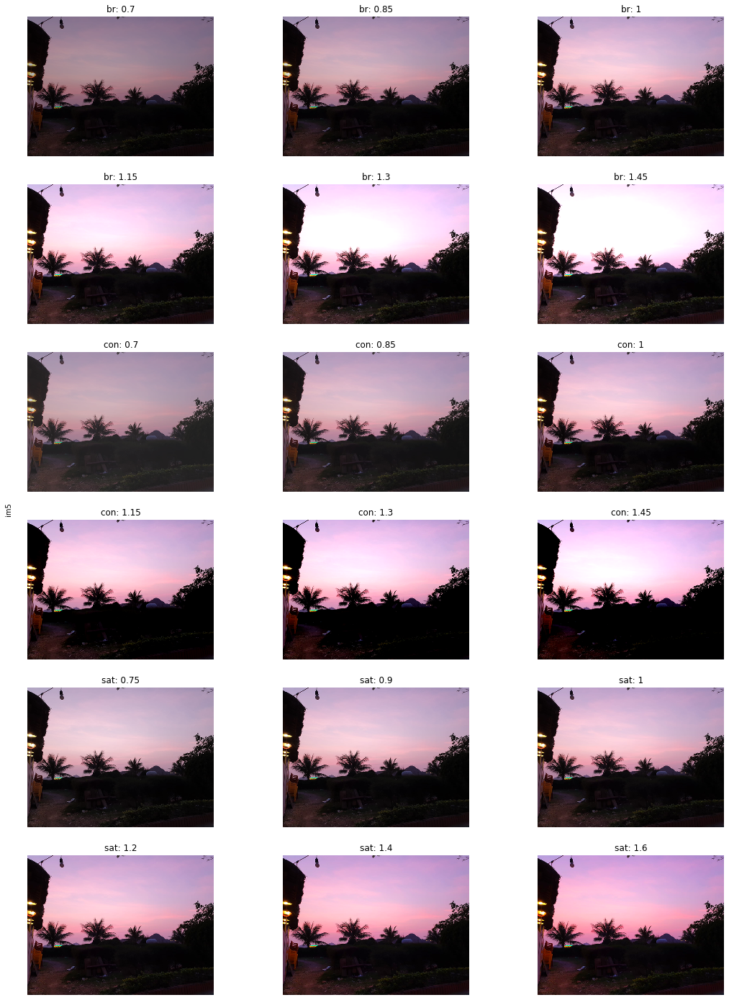

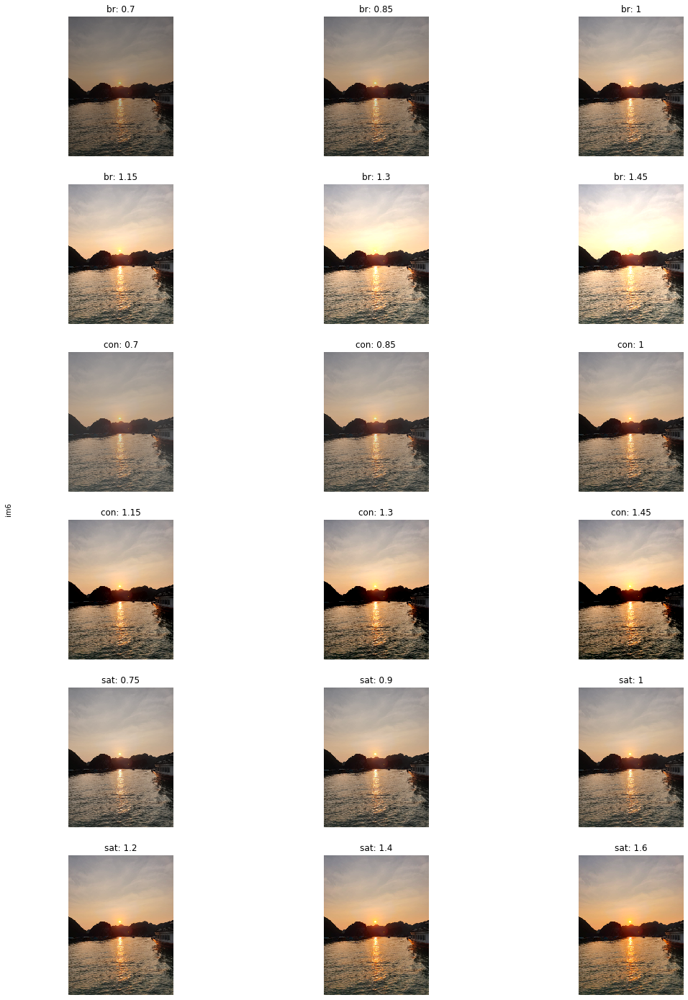

In [11]:
brValues = [0.7,0.85,1,1.15,1.3, 1.45] #0.15 Schritte
contrValues = [0.7,0.85,1,1.15,1.3, 1.45] #0.15 Schritte
satValues = [0.75,0.9,1,1.2,1.4,1.6] #Angepasst
pVals = {
    'br': brValues,
    'con': contrValues,
    'sat': satValues
}

def showDataForImage(imageName):
    fig = plt.figure(figsize=(18, 25))
    fig.text(0.115, 0.5, imageName, va='center', rotation='vertical')
    for i, propertyName in enumerate(['br','con','sat']):
        propertyValues = pVals[propertyName]
        
        for j, val in enumerate(propertyValues):
            v = str(val).replace('.','_')
            im = np.array(Image.open(f'./images/{imageName}/{imageName}-{propertyName}-{v}.png'))
            plt.subplot(6,3,i*6+j+1)
            plt.imshow(im)
            plt.axis('off')
            plt.title(f"{propertyName}: {propertyValues[j]}")
                      
for imName in ['im1','im2','im3','im4','im5','im6']:
    showDataForImage(imName)

Für den ersten Teil des Experiments haben wir für jedes Bild und Ausprägung einen paarweisen Vergleich der Abstufungen durchgeführt. Dabei muss die Versuchsperson das optisch bzw. ästhetisch ansprechendere Bild wählen. Da wir 6 Abstufungen benutzen ergeben sich $6 \choose 2$ = 15 Vergleiche pro Eigenschaft.
Da wir 3 Eigenschaften pro Bild und 6 Bilder haben, ergeben sich $15*3*6=270$ Vergleiche pro Versuchsdurchlauf. Jeder hat den Versuch drei Mal durchgeführt. Somit ergaben sich 810 paarweise Vergleiche pro Person, was insgesamt ca. 30-40 Minuten beansprucht hat. Das Experiment wurde von allen 4 Gruppenmitgliedern durchgeführt.

## 3. Ergebnisse

### Teil 1

### Barplots
Nachdem das Experiment durchgeführt wird, werden für die Barplots alle Daten konsolidiert und in eine große Liste gespeichert. Im 1. Teil wurde dies aufwendiger gemacht, als gebraucht - im 2. Teil haben wir daraus gelernt und die .csv Daten effizienter und unaufwendiger abgespeichert.<br>
Da der Versuch auf Vergeleich von jeweils 2 Bildern basiert, muss aufgezählt werden wie oft jedes Bild gewählt wurde.<br>
* Minimaler Wert eines Bildes: 0 - das Bild wurde nie gewählt<br>
* Maximaler Wert eines Bildes: 5 - das Bild wurde bei jedem Vergleich gewählt, in dem es gezeigt wurde

Die absoluten Häufigkeiten werden dann über die Anzahl der Versuche gemittelt.<br>
Bei den folgenden Plots sind zum Einen die Plots aller Versuchspersonen unter sich gemittelt zu sehen und zum Anderen die nicht unter uns gemittelten Plots.<br>
**Anmerkung:** n = 4 Versuchspersonen, Anzahl Durchläufe pro Person = 3

In [16]:
#Daten aufbereiten

#Erstelle Liste von allen .csv Dateinamen im <data> folder
fileNames = daf.listFiles()

#Extrahiere und konsolidiere alle Daten aus den .csv Dateien in eine Liste aus Einträgen
allData = daf.consolidate(fileNames)

#Fasse mehrere Versuchs-einträge durch Konkatenation der Wertelisten in jeweils einen Eintrag zusammen
mergedData = daf.mergeTries(allData)

Die x-Achse besteht aus den einzelnen Abstufungen der jeweiligen Eigenschaft. Die y-Achse beschreibt die Häufigkeit der Auswahl einer bestimmten Abstufung und nimmt somit Werte von 0 bis 5 ein (minimal und maximal erreichbarer Wert). Im Titel ist die Anzahl **n** der Versuchspersonen, der **Bildname**, die betrachtete **Eigenschaft** und der Parameter **avg** zu sehen. Letzterer sagt aus, ob die Daten unter den Versuchspersonen gemittelt wurden oder nicht (avg = average). <br>
Es sind oftmals Trends zu erkennen, was man an den höchsten Balken an einem Bild erkennen kann. Dies bedeutet demnach dass die am meisten gewählte Abstufung einer Eigenschaft auch am ästhetisch ansprechensten interpretiert wurde. Diese variieren von Bild zu Bild, aber auch von Person zu Person, man kann individuelle Favoriten der Personen somit rauslesen.

**Anmerkung:** Auf der x-Achsen Beschriftung ist zudem der MSE zu sehen, welcher nur für interne Zwecke benutzt wurde. Um genauer zu sein, haben wir den MSE als Abweichung der Werte zwischen den Teilnehmern benutzt, um herauszufinden welche Bilder wir im 2. Teil des Experiments benutzen können. Ein hoher Wert bedeutet, dass die Teilnehmer sich nicht einig waren und macht dieses Bild dann zum optimalen Kandidaten für die Untersuchung mit verschiedenen Skalen.

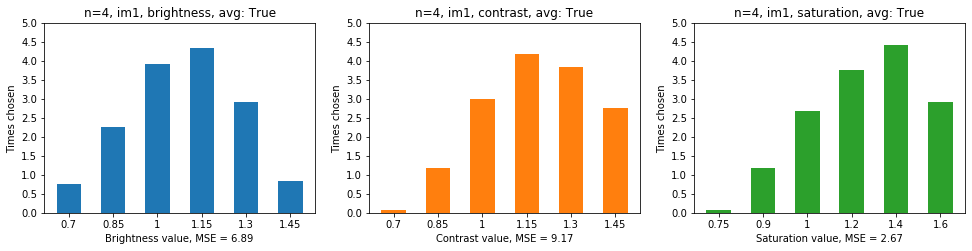

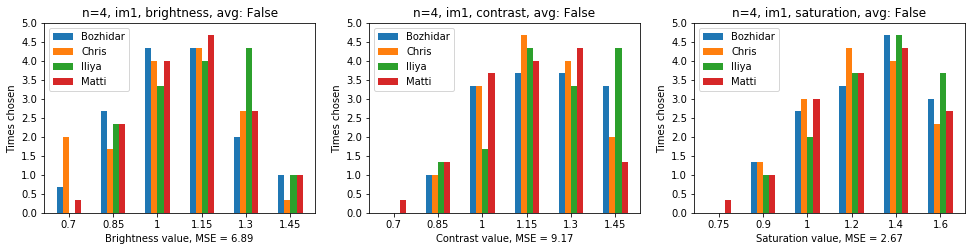

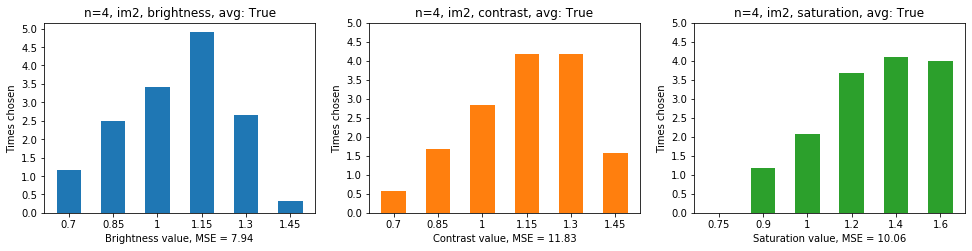

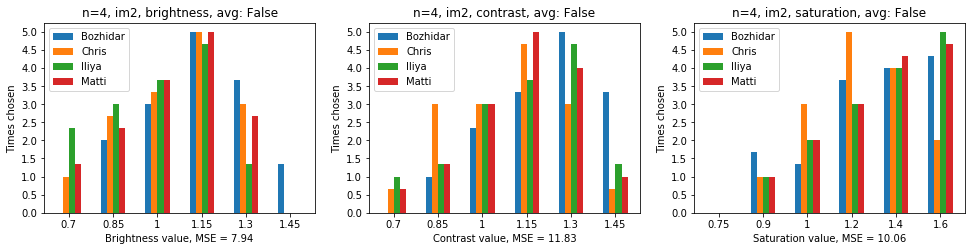

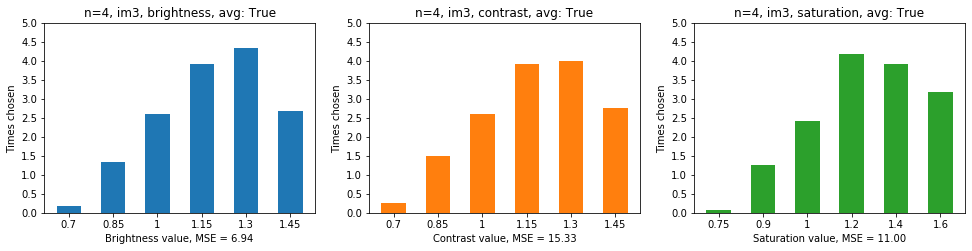

...

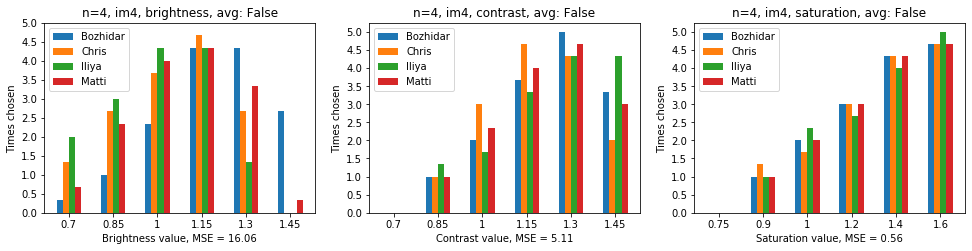

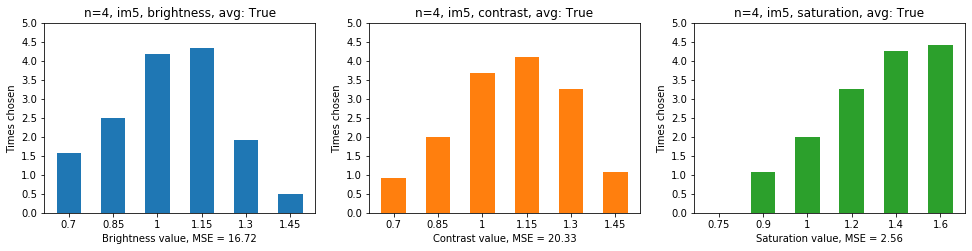

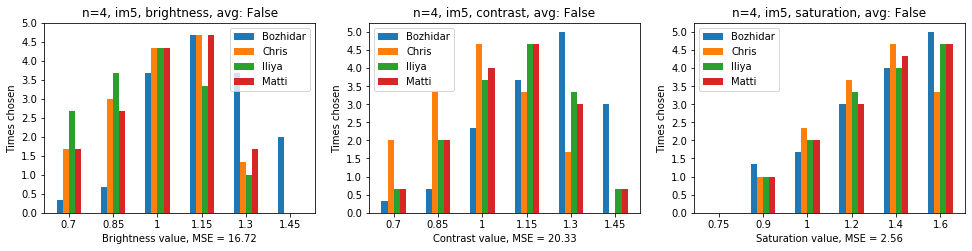

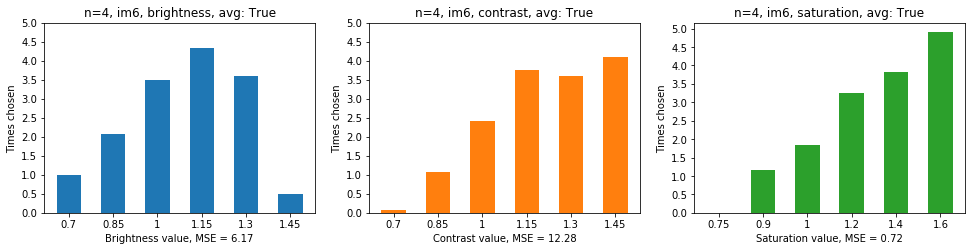

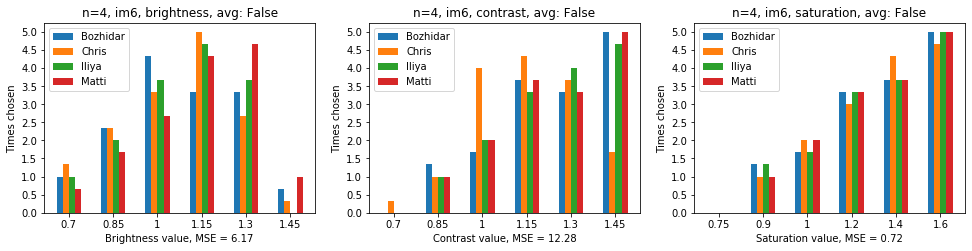

In [17]:
#Alle Barplots für den 1. Teil anzeigen, sowohl gemittelt als auch pro Person
daf.do(mergedData)

Obwohl die Daten von Bild zu Bild variieren, lassen sich doch einige Trends erkennen. Wenn wir alle Daten über die Bilder mitteln, bekommen wir somit einen groben Trend unserer Daten. Dabei stellen sich folgende Abstufungen in den Vordergrund:
* Helligkeit: Die Abstufung 1.15
* Kontrast: Die Abstufungen 1.15 und 1.3
* Saturation: Die Abstufungen 1.2, **1.4** und 1.6

Man kann erkennen, dass es bei der Helligkeit einen eindeutigen Sieger gibt. Beim Kontrast sieht man, dass die Häufigkeit der Wahl der Abstufung 1.45 wieder sinkt. Das zeigt, dass Bilder von Sonnenuntergängen mit einem sehr hohen Kontrast eher schlechter bewertet werden. Das liegt vielleicht daran, dass die Bilder als "fake" angesehen werden. Bei der Saturation ist klar zu erkennen, dass die höheren Werte auch bessere Ästhetik mit sich bringen. Das haben wir als Gruppe auch direkt bei der Durchführung des Experimentes gemerkt.

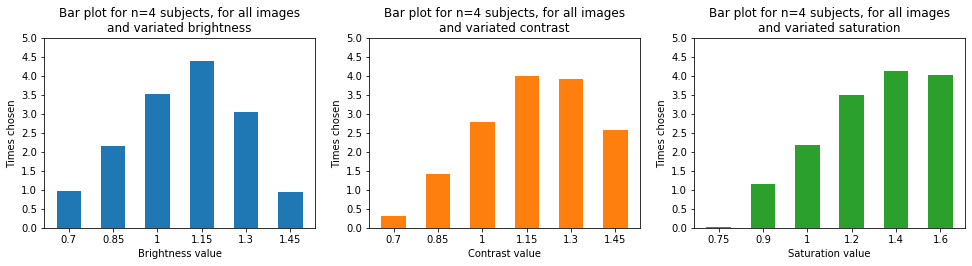

In [18]:
daf.showAverage(mergedData)

### Heatmaps
Wir haben heatmaps benutzt um nach Trends zu suchen und auch extreme Werte zu ignorieren.

Wir haben unterschidliche Versionen von Heatmaps gemacht: _"Personalised and separated on images"; "Not personalised (all of our results combined), but separated on images"; "Personalised, but for all images combined"; "For all people and for all images combined"_. So haben wir unterschiedliche Perspektiven auf unser Daten bekommen.

# Personalised and separated on images

Hier kann man sehen wie oft hat jede Versuchsperson jedes Image beim Vergleich zu jedes anderes "Version" von diesem Image gewählt.

Die __absolute Häufigkeit__ ist gleich __3__, weil alle 3 Versuche kombiniert sind.

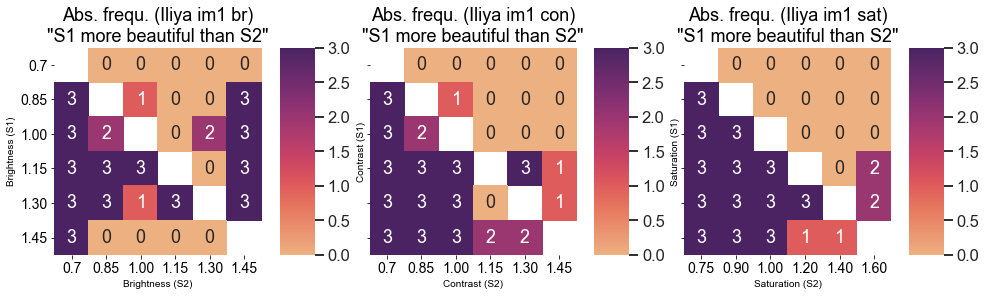

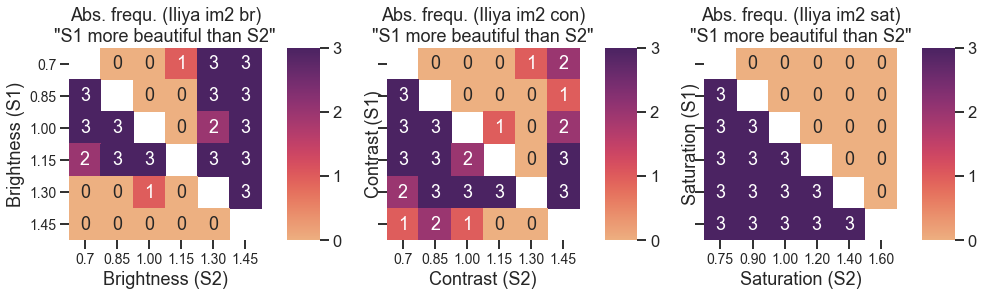

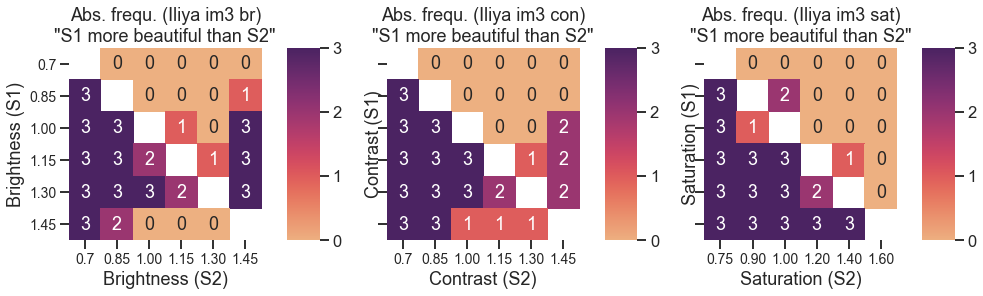

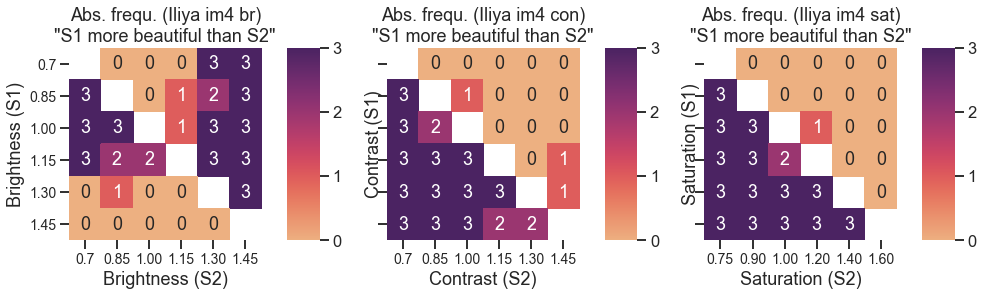

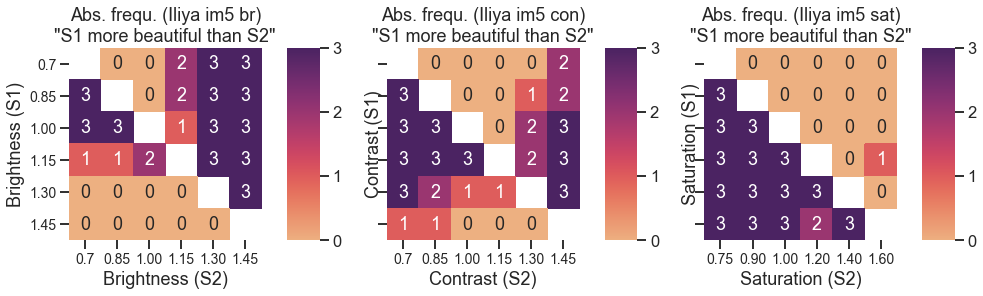

...

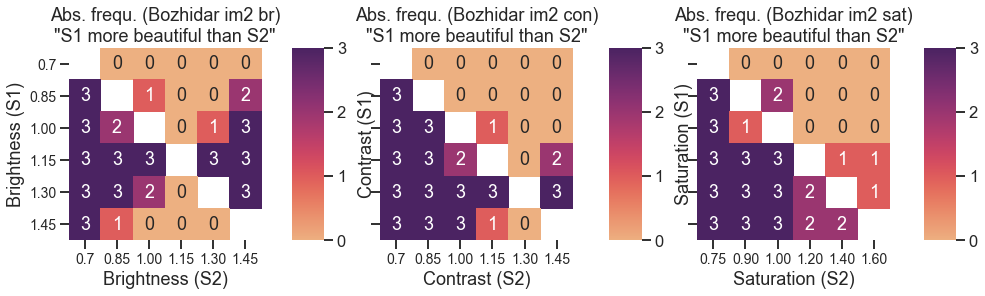

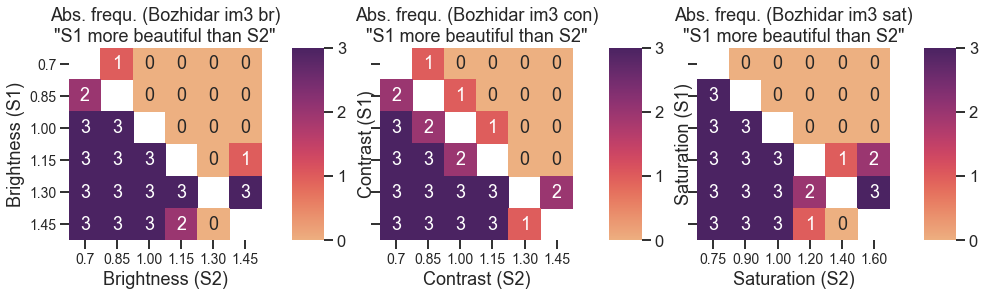

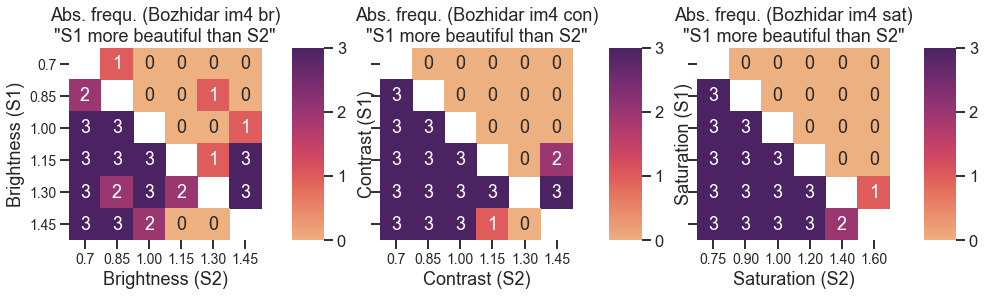

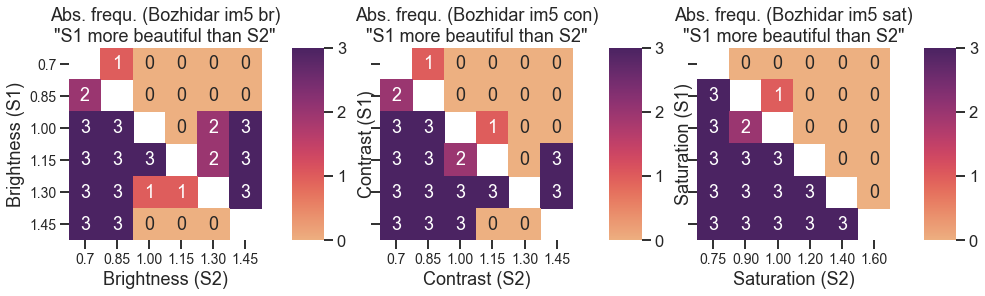

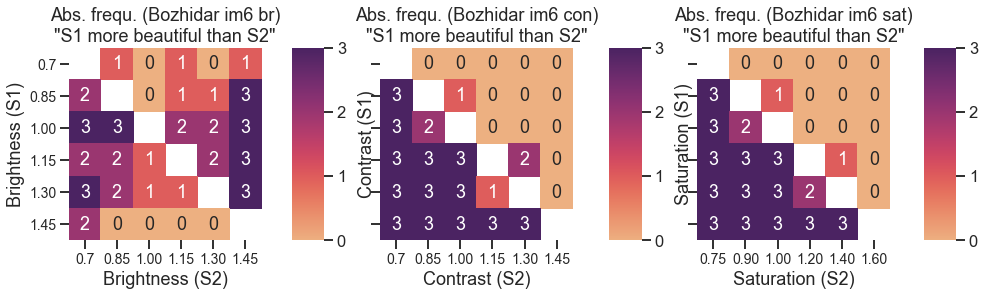

In [19]:
names = ["Iliya", "Chris", "Matti", "Bozhidar"]
images = ["im1", "im2", "im3", "im4", "im5", "im6"]
variables = ["br", "con", "sat"]

for name in names:
    for image in images:
        
        fig, ax = plt.subplots(ncols = 3, sharey = True, constrained_layout = True)
        fig.set_figwidth(13.5)
        
        for variable in variables:
            
            observations = np.array( [[np.nan, 0, 0, 0, 0, 0],
                                      [0, np.nan, 0, 0, 0, 0],
                                      [0, 0, np.nan, 0, 0, 0],
                                      [0, 0, 0, np.nan, 0, 0],
                                      [0, 0, 0, 0, np.nan, 0],
                                      [0, 0, 0, 0, 0, np.nan]])
            
            
            
            for versuch in range (3):
                
                f = open('data/' + name + '_ordinal_' + image + '_' + variable + '_' + str(versuch) + '.csv')
                
                csv_f = csv.reader(f)

                for row in csv_f:

                    if(row != []):

                        if(row[0] == '0'):
                            x = int(row[1]) - 1
                            y = int(row[2]) - 1
                            observations[x][y] += 1

                        if(row[0] == '1'):
                            x = int(row[1]) - 1
                            y = int(row[2]) - 1
                            observations[y][x] += 1

                f.close
                
            # Heatmap
            sns.set_style('whitegrid')
            sns.set_context('talk')

            # absolute numbers
            matrix = observations

            # Parametern und Texten anpassen !
            if(variable == 'br'):
                ax1 = sns.heatmap(matrix, square = True, ax = ax[0], vmin = 0, vmax = 3, cmap = "flare", annot = True)
                ax1.tick_params(left = True, bottom = True)
                ax[0].set_xticklabels(['0.7', '0.85', '1.00', '1.15', '1.30', '1.45'], fontsize = 14)
                ax[0].set_yticklabels(['0.7', '0.85', '1.00', '1.15', '1.30', '1.45'], rotation = 0, fontsize = 14)
                ax[0].set_xlabel('Brightness (S2)')
                ax[0].set_ylabel('Brightness (S1)')
                ax[0].set_title('Abs. frequ. (' + name + ' ' + image + ' ' + variable + ')\n"S1 more beautiful than S2"')
                
                    
            if (variable == 'con'):
                ax2 = sns.heatmap(matrix, square = True, ax = ax[1], vmin = 0, vmax = 3, cmap = "flare", annot = True)
                ax2.tick_params(left = True, bottom = True)
                ax[1].set_xticklabels(['0.7', '0.85', '1.00', '1.15', '1.30', '1.45'], fontsize = 14)
                ax[1].set_yticklabels(['0.7', '0.85', '1.00', '1.15', '1.30', '1.45'], rotation = 0, fontsize = 14)
                ax[1].set_xlabel('Contrast (S2)')
                ax[1].set_ylabel('Contrast (S1)')
                ax[1].set_title('Abs. frequ. (' + name + ' ' + image + ' ' + variable + ')\n"S1 more beautiful than S2"')
                
                    
            if (variable == 'sat'):
                ax3 = sns.heatmap(matrix, square = True, ax = ax[2], vmin = 0, vmax = 3, cmap = "flare", annot = True)
                ax3.tick_params(left = True, bottom = True)
                ax[2].set_xticklabels(['0.75', '0.90', '1.00', '1.20', '1.40', '1.60'], fontsize = 14)
                ax[2].set_yticklabels(['0.7', '0.85', '1.00', '1.15', '1.30', '1.45'], rotation = 0, fontsize = 14)
                #ax[2].set_yticklabels(['0.75', '0.90', '1.00', '1.20', '1.40', '1.60'], rotation = 0, fontsize = 14)
                ax[2].set_xlabel('Saturation (S2)')
                ax[2].set_ylabel('Saturation (S1)')
                ax[2].set_title('Abs. frequ. (' + name + ' ' + image + ' ' + variable + ')\n"S1 more beautiful than S2"')

        plt.show()
    
        #f.savefig(name + '_' + image + '_' + variable +'_heatmap_absolut.pdf')

# Not personalised (all of our results combined), but separated on images

Hier kann man sehen wie oft haben alle Versuchspersone jedes Image beim Vergleich zu jedes anderes "Version" von diesem Image gewählt.

Die __absolute Häufigkeit__ ist gleich __12__, weil alle 3 Versuche von alle 4 Versuchspersone kombiniert sind (3 * 4 = 12).

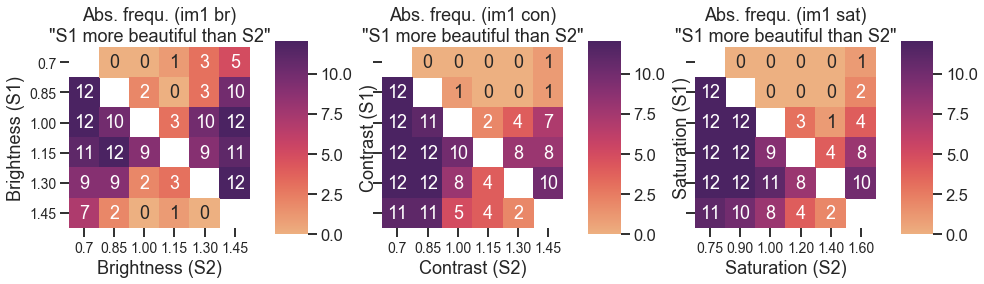

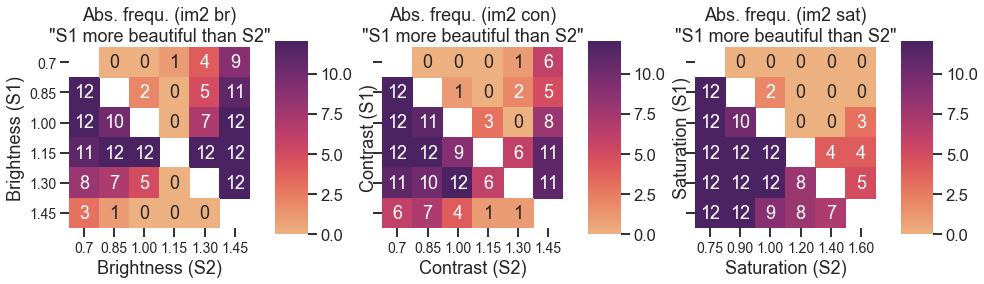

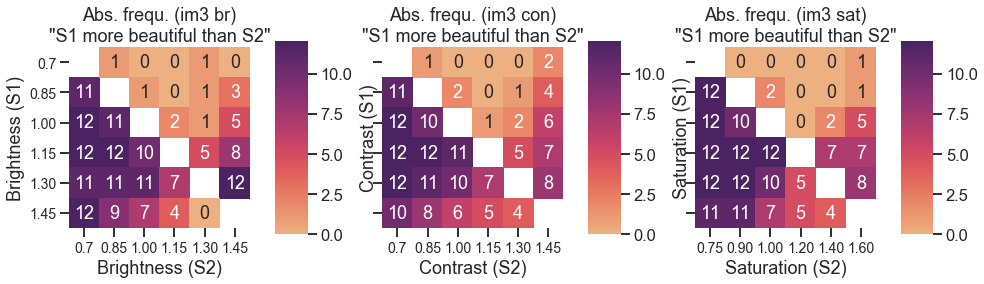

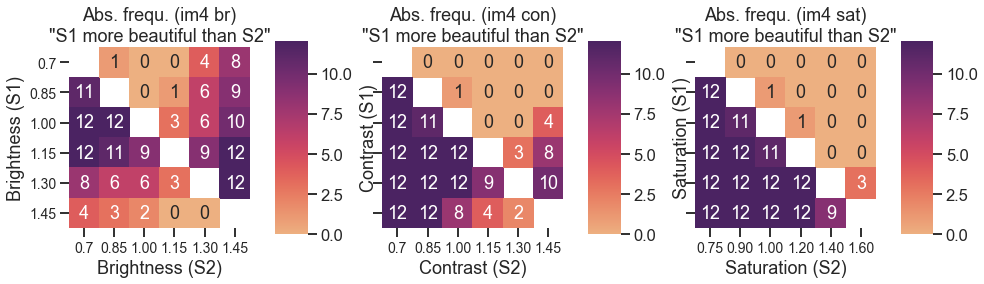

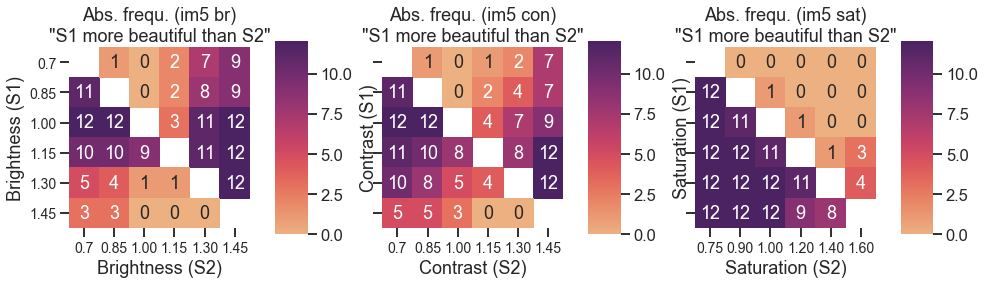

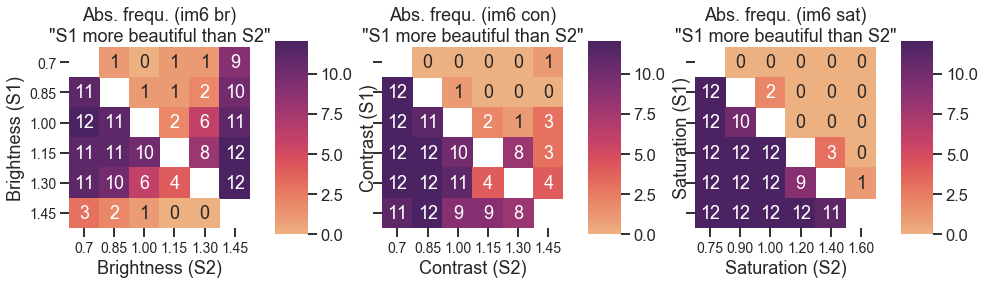

In [20]:
names = ["Iliya", "Chris", "Matti", "Bozhidar"]
images = ["im1", "im2", "im3", "im4", "im5", "im6"]
variables = ["br", "con", "sat"]


for image in images:
    
    fig, ax = plt.subplots(ncols = 3, sharey = True, constrained_layout = True)
    fig.set_figwidth(13.5)
    
    for variable in variables:

        observations = np.array( [[np.nan, 0, 0, 0, 0, 0],
                                      [0, np.nan, 0, 0, 0, 0],
                                      [0, 0, np.nan, 0, 0, 0],
                                      [0, 0, 0, np.nan, 0, 0],
                                      [0, 0, 0, 0, np.nan, 0],
                                      [0, 0, 0, 0, 0, np.nan]])
        
        for name in names:
            for versuch in range (3):
                
                f = open('data/' + name + '_ordinal_' + image + '_' + variable + '_' + str(versuch) + '.csv')
                
                csv_f = csv.reader(f)

                for row in csv_f:

                    if(row != []):

                        if(row[0] == '0'):
                            x = int(row[1]) - 1
                            y = int(row[2]) - 1
                            observations[x][y] += 1

                        if(row[0] == '1'):
                            x = int(row[1]) - 1
                            y = int(row[2]) - 1
                            observations[y][x] += 1

                f.close
        
        # Heatmap
        sns.set_style('whitegrid')
        sns.set_context('talk')

        # absolute numbers
        matrix = observations

        # Parametern und Texten anpassen !
        if(variable == 'br'):
            ax1 = sns.heatmap(matrix, square = True, ax = ax[0], vmin = 0, vmax = 12, cmap = "flare", annot = True)
            ax1.tick_params(left = True, bottom = True)
            ax[0].set_xticklabels(['0.7', '0.85', '1.00', '1.15', '1.30', '1.45'], fontsize = 14)
            ax[0].set_yticklabels(['0.7', '0.85', '1.00', '1.15', '1.30', '1.45'], rotation = 0, fontsize = 14)
            ax[0].set_xlabel('Brightness (S2)')
            ax[0].set_ylabel('Brightness (S1)')
            ax[0].set_title('Abs. frequ. (' + image + ' ' + variable + ')\n"S1 more beautiful than S2"')
                
                    
        if (variable == 'con'):
            ax2 = sns.heatmap(matrix, square = True, ax = ax[1], vmin = 0, vmax = 12, cmap = "flare", annot = True)
            ax2.tick_params(left = True, bottom = True)
            ax[1].set_xticklabels(['0.7', '0.85', '1.00', '1.15', '1.30', '1.45'], fontsize = 14)
            ax[1].set_yticklabels(['0.7', '0.85', '1.00', '1.15', '1.30', '1.45'], rotation = 0, fontsize = 14)
            ax[1].set_xlabel('Contrast (S2)')
            ax[1].set_ylabel('Contrast (S1)')
            ax[1].set_title('Abs. frequ. (' + image + ' ' + variable + ')\n"S1 more beautiful than S2"')
                
                    
        if (variable == 'sat'):
            ax3 = sns.heatmap(matrix, square = True, ax = ax[2], vmin = 0, vmax = 12, cmap = "flare", annot = True)
            ax3.tick_params(left = True, bottom = True)
            ax[2].set_xticklabels(['0.75', '0.90', '1.00', '1.20', '1.40', '1.60'], fontsize = 14)
            ax[2].set_yticklabels(['0.7', '0.85', '1.00', '1.15', '1.30', '1.45'], rotation = 0, fontsize = 14)
            #ax[2].set_yticklabels(['0.7', '0.90', '1.00', '1.20', '1.40', '1.60'], rotation = 0, fontsize = 14)
            ax[2].set_xlabel('Saturation (S2)')
            ax[2].set_ylabel('Saturation (S1)')
            ax[2].set_title('Abs. frequ. (' + image + ' ' + variable + ')\n"S1 more beautiful than S2"')
            
    plt.show()
        
    #f.savefig(image + '_' + variable +'_heatmap_absolut.pdf')

# Personalised, but for all images combined

Hier kann man sehen wie oft hat jede Versuchsperson jeden Wert von die drei Variablen _(Brightness, Contrast, Saturation)_ gewählt. (Persönliche Vorlieben entdecken und für extreme Werte aufpassen)

Die __absolute Häufigkeit__ ist gleich __18__, weil alle 3 Versuche für alle 6 Images kombiniert sind (3 * 6 = 18).


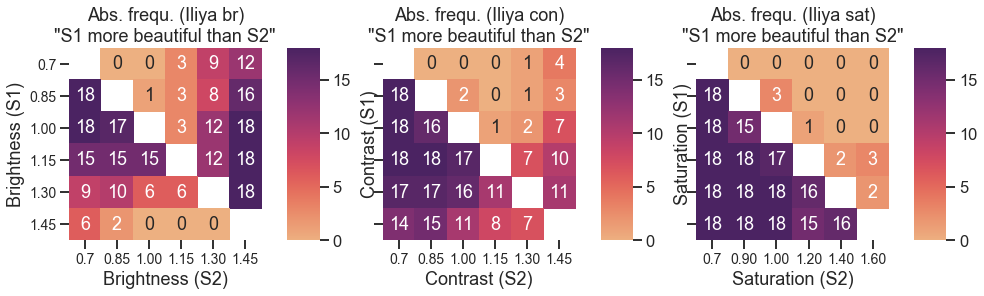

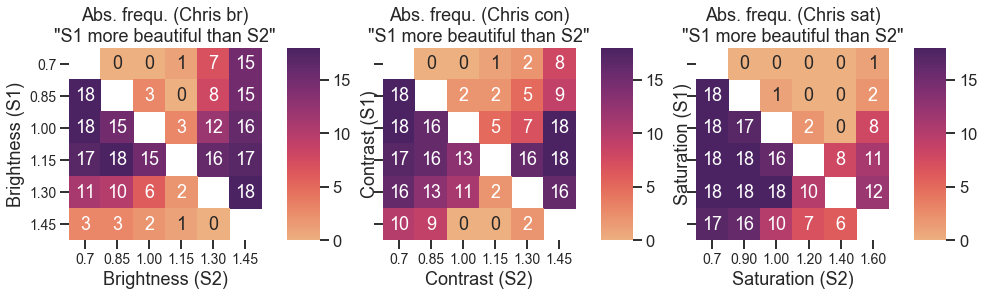

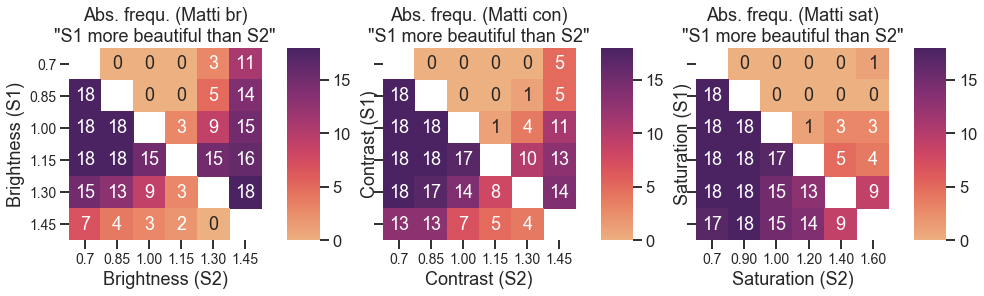

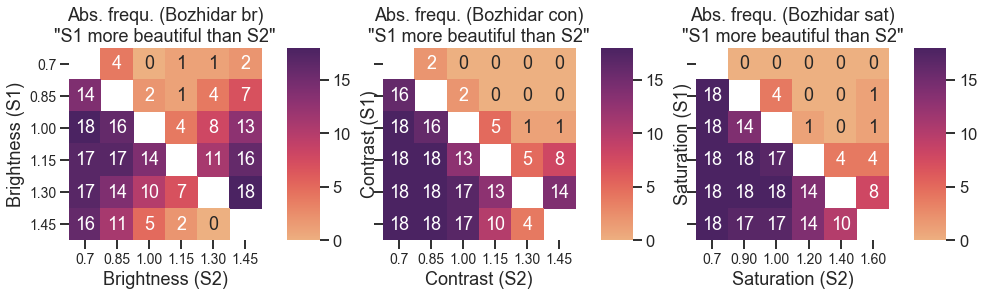

In [21]:
names = ["Iliya", "Chris", "Matti", "Bozhidar"]
images = ["im1", "im2", "im3", "im4", "im5", "im6"]
variables = ["br", "con", "sat"]

for name in names:
    
    fig, ax = plt.subplots(ncols = 3, sharey = True, constrained_layout = True)
    fig.set_figwidth(13.5)
    
    for variable in variables:
        
        observations = np.array( [[np.nan, 0, 0, 0, 0, 0],
                                      [0, np.nan, 0, 0, 0, 0],
                                      [0, 0, np.nan, 0, 0, 0],
                                      [0, 0, 0, np.nan, 0, 0],
                                      [0, 0, 0, 0, np.nan, 0],
                                      [0, 0, 0, 0, 0, np.nan]])
        for image in images:
            for versuch in range (3):
                
                f = open('data/' + name + '_ordinal_' + image + '_' + variable + '_' + str(versuch) + '.csv')
                
                csv_f = csv.reader(f)

                for row in csv_f:

                    if(row != []):

                        if(row[0] == '0'):
                            x = int(row[1]) - 1
                            y = int(row[2]) - 1
                            observations[x][y] += 1

                        if(row[0] == '1'):
                            x = int(row[1]) - 1
                            y = int(row[2]) - 1
                            observations[y][x] += 1

                f.close
                
        # Heatmap
        sns.set_style('whitegrid')
        sns.set_context('talk')
        
        # absolute numbers
        matrix = observations

        # Parametern und Texten anpassen !
        if(variable == 'br'):
                ax1 = sns.heatmap(matrix, square = True, ax = ax[0], vmin = 0, vmax = 18, cmap = "flare", annot = True)
                ax1.tick_params(left = True, bottom = True)
                ax[0].set_xticklabels(['0.7', '0.85', '1.00', '1.15', '1.30', '1.45'], fontsize = 14)
                ax[0].set_yticklabels(['0.7', '0.85', '1.00', '1.15', '1.30', '1.45'], rotation = 0, fontsize = 14)
                ax[0].set_xlabel('Brightness (S2)')
                ax[0].set_ylabel('Brightness (S1)')
                ax[0].set_title('Abs. frequ. (' + name + ' ' + variable + ')\n"S1 more beautiful than S2"')
                
                    
        if (variable == 'con'):
                ax2 = sns.heatmap(matrix, square = True, ax = ax[1], vmin = 0, vmax = 18, cmap = "flare", annot = True)
                ax2.tick_params(left = True, bottom = True)
                ax[1].set_xticklabels(['0.7', '0.85', '1.00', '1.15', '1.30', '1.45'], fontsize = 14)
                ax[1].set_yticklabels(['0.7', '0.85', '1.00', '1.15', '1.30', '1.45'], rotation = 0, fontsize = 14)
                ax[1].set_xlabel('Contrast (S2)')
                ax[1].set_ylabel('Contrast (S1)')
                ax[1].set_title('Abs. frequ. (' + name + ' ' + variable + ')\n"S1 more beautiful than S2"')
                
                    
        if (variable == 'sat'):
                ax3 = sns.heatmap(matrix, square = True, ax = ax[2], vmin = 0, vmax = 18, cmap = "flare", annot = True)
                ax3.tick_params(left = True, bottom = True)
                ax[2].set_xticklabels(['0.7', '0.90', '1.00', '1.20', '1.40', '1.60'], fontsize = 14)
                ax[2].set_yticklabels(['0.7', '0.85', '1.00', '1.15', '1.30', '1.45'], rotation = 0, fontsize = 14)
                #ax[2].set_yticklabels(['0.7', '0.90', '1.00', '1.20', '1.40', '1.60'], rotation = 0, fontsize = 14)
                ax[2].set_xlabel('Saturation (S2)')
                ax[2].set_ylabel('Saturation (S1)')
                ax[2].set_title('Abs. frequ. (' + name + ' ' + variable + ')\n"S1 more beautiful than S2"')
            
    plt.show()
    
    #f.savefig(name + '_' + variable +'_heatmap_absolut.pdf')

# For all people and for all images combined

Hier kann man sehen wie oft haben alle Versuchspersone jeden Wert von die drei Variablen _(Brightness, Contrast, Saturation)_ gewählt, kombiniert für alle Images.

Die __absolute Häufigkeit__ ist gleich __72__, weil alle 3 Versuche für alle 4 Versuchpersone für alle 6 Images kombiniert sind (3 * 4 * 6 = 72).

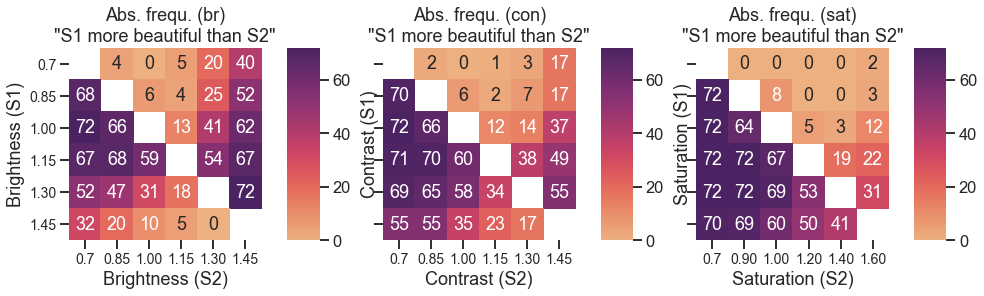

In [22]:
names = ["Iliya", "Chris", "Matti", "Bozhidar"]
images = ["im1", "im2", "im3", "im4", "im5", "im6"]
variables = ["br", "con", "sat"]

fig, ax = plt.subplots(ncols = 3, sharey = True, constrained_layout = True)
fig.set_figwidth(13.5)

for variable in variables:
        
    observations = np.array( [  [np.nan, 0, 0, 0, 0, 0],
                                [0, np.nan, 0, 0, 0, 0],
                                [0, 0, np.nan, 0, 0, 0],
                                [0, 0, 0, np.nan, 0, 0],
                                [0, 0, 0, 0, np.nan, 0],
                                [0, 0, 0, 0, 0, np.nan]])
        
    for name in names:
        for image in images:
            for versuch in range (3):
                
                f = open('data/' + name + '_ordinal_' + image + '_' + variable + '_' + str(versuch) + '.csv')
                
                csv_f = csv.reader(f)

                for row in csv_f:

                    if(row != []):

                        if(row[0] == '0'):
                            x = int(row[1]) - 1
                            y = int(row[2]) - 1
                            observations[x][y] += 1

                        if(row[0] == '1'):
                            x = int(row[1]) - 1
                            y = int(row[2]) - 1
                            observations[y][x] += 1

                f.close
                
    # Heatmap
    sns.set_style('whitegrid')
    sns.set_context('talk')

    # absolute numbers
    matrix = observations

    # making heatmap
    #f = plt.figure(figsize=(7, 5))
    #ax = sns.heatmap(matrix, square=True,  vmin = 0, vmax = 72,
    #                         cmap="flare", # can be changed to another sequential colormap
    #                         annot=True) # optional with numbers annotated

    # Parametern und Texten anpassen !
    if(variable == 'br'):
        ax1 = sns.heatmap(matrix, square = True, ax = ax[0], vmin = 0, vmax = 72, cmap = "flare", annot = True)
        ax1.tick_params(left = True, bottom = True)
        ax[0].set_xticklabels(['0.7', '0.85', '1.00', '1.15', '1.30', '1.45'], fontsize = 14)
        ax[0].set_yticklabels(['0.7', '0.85', '1.00', '1.15', '1.30', '1.45'], rotation = 0, fontsize = 14)
        ax[0].set_xlabel('Brightness (S2)')
        ax[0].set_ylabel('Brightness (S1)')
        ax[0].set_title('Abs. frequ. (' + variable + ')\n"S1 more beautiful than S2"')
                
                
    if (variable == 'con'):
        ax2 = sns.heatmap(matrix, square = True, ax = ax[1], vmin = 0, vmax = 72, cmap = "flare", annot = True)
        ax2.tick_params(left = True, bottom = True)
        ax[1].set_xticklabels(['0.7', '0.85', '1.00', '1.15', '1.30', '1.45'], fontsize = 14)
        ax[1].set_yticklabels(['0.7', '0.85', '1.00', '1.15', '1.30', '1.45'], rotation = 0, fontsize = 14)
        ax[1].set_xlabel('Contrast (S2)')
        ax[1].set_ylabel('Contrast (S1)')
        ax[1].set_title('Abs. frequ. (' + variable + ')\n"S1 more beautiful than S2"')
                
                    
    if (variable == 'sat'):
        ax3 = sns.heatmap(matrix, square = True, ax = ax[2], vmin = 0, vmax = 72, cmap = "flare", annot = True)
        ax3.tick_params(left = True, bottom = True)
        ax[2].set_xticklabels(['0.7', '0.90', '1.00', '1.20', '1.40', '1.60'], fontsize = 14)
        ax[2].set_yticklabels(['0.7', '0.85', '1.00', '1.15', '1.30', '1.45'], rotation = 0, fontsize = 14)
        #ax[2].set_yticklabels(['0.7', '0.90', '1.00', '1.20', '1.40', '1.60'], rotation = 0, fontsize = 14)
        ax[2].set_xlabel('Saturation (S2)')
        ax[2].set_ylabel('Saturation (S1)')
        ax[2].set_title('Abs. frequ. (' + variable + ')\n"S1 more beautiful than S2"')
            
plt.show()
    
    #f.savefig(variable +'_heatmap_absolut.pdf')

# Best pic?

Hier kann man sehen wie oft haben alle Versuchspersone jeden Wert der drei Variablen _(Brightness, Contrast, Saturation)_ für jedes Image gewählt wurden.

Ziel: Beste "Version" von jedem Image finden.

Die __absolute Häufigkeit__ ist gleich __60__, weil alle 3 Versuche für alle 4 Versuchpersone und das Vergleich gegen alle 5 andere "Versione" von dem Image kombiniert sind (3 * 4 * 5 = 60).

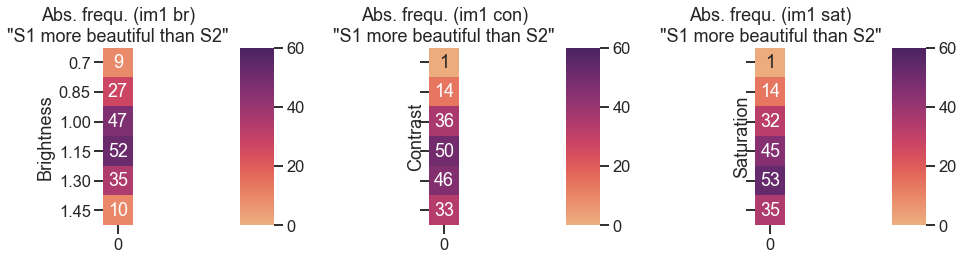

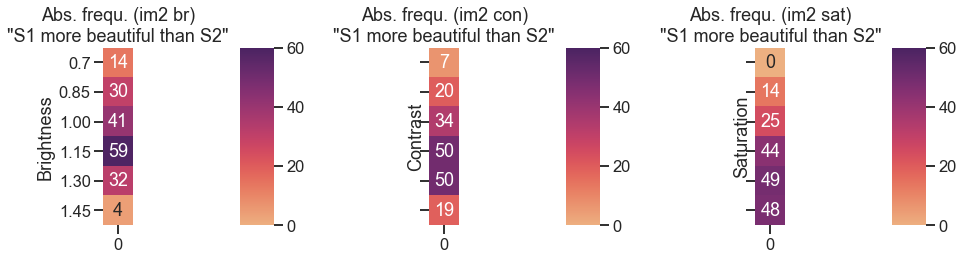

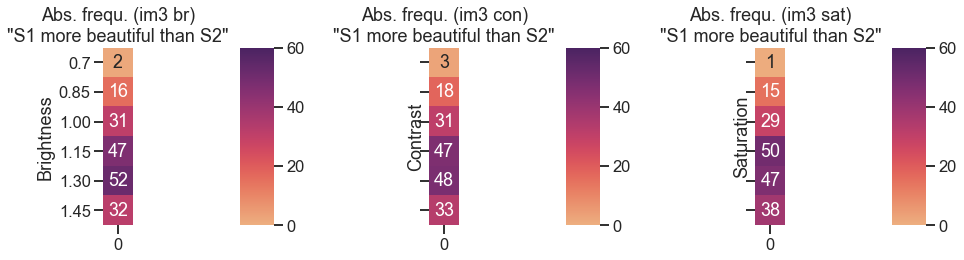

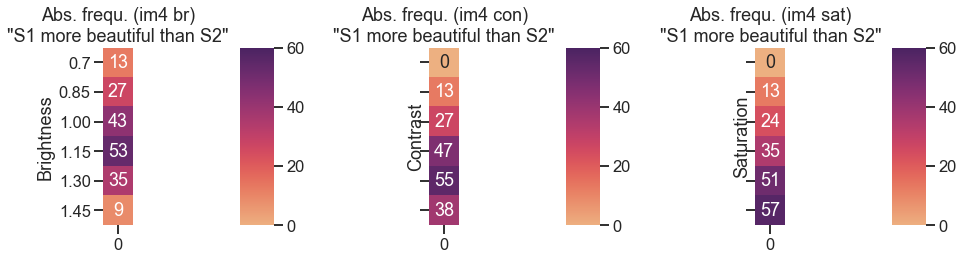

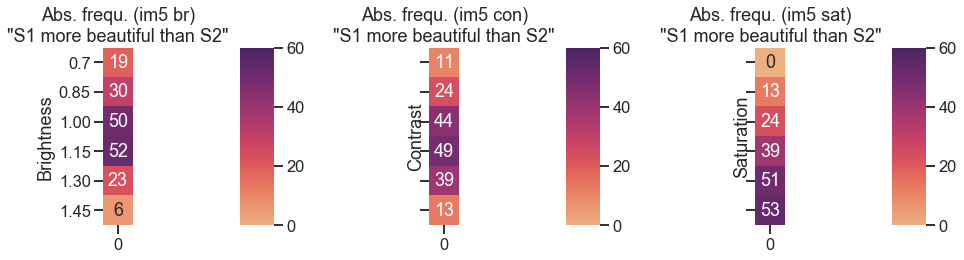

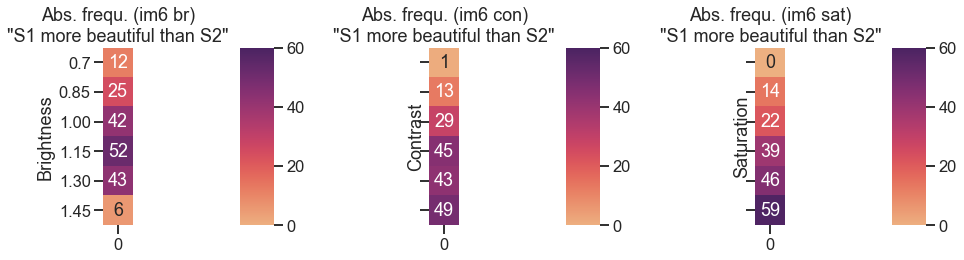

In [23]:
names = ["Iliya", "Chris", "Matti", "Bozhidar"]
images = ["im1", "im2", "im3", "im4", "im5", "im6"]
variables = ["br", "con", "sat"]


for image in images:
    
    fig, ax = plt.subplots(ncols = 3, sharey = True, constrained_layout = True)
    fig.set_figwidth(13.5)
    fig.set_figheight(3.5)
    
    for variable in variables:

        observations = np.array( [[np.nan, 0, 0, 0, 0, 0],
                                      [0, np.nan, 0, 0, 0, 0],
                                      [0, 0, np.nan, 0, 0, 0],
                                      [0, 0, 0, np.nan, 0, 0],
                                      [0, 0, 0, 0, np.nan, 0],
                                      [0, 0, 0, 0, 0, np.nan]])
        
        for name in names:
            for versuch in range (3):
                
                f = open('data/' + name + '_ordinal_' + image + '_' + variable + '_' + str(versuch) + '.csv')
                
                csv_f = csv.reader(f)

                for row in csv_f:

                    if(row != []):

                        if(row[0] == '0'):
                            x = int(row[1]) - 1
                            y = int(row[2]) - 1
                            observations[x][y] += 1

                        if(row[0] == '1'):
                            x = int(row[1]) - 1
                            y = int(row[2]) - 1
                            observations[y][x] += 1

                f.close
        
        # Heatmap
        sns.set_style('whitegrid')
        sns.set_context('talk')

        # absolute numbers
        matrix = [[0],
                  [0],
                  [0],
                  [0],
                  [0],
                  [0]]
        
        for i in range (6):
            for j in range (6):
                if i != j:
                    matrix[i][0] += observations[i][j]

        # Parametern und Texten anpassen !
        if(variable == 'br'):
            ax1 = sns.heatmap(matrix, square = True, ax = ax[0], vmin = 0, vmax = 60, cmap = "flare", annot = True)
            ax1.tick_params(left = True, bottom = True)
            ax[0].set_yticklabels(['0.7', '0.85', '1.00', '1.15', '1.30', '1.45'], rotation = 0)
            ax[0].set_ylabel('Brightness')
            ax[0].set_title('Abs. frequ. (' + image + ' ' + variable + ')\n"S1 more beautiful than S2"')
                
                    
        if (variable == 'con'):
            ax2 = sns.heatmap(matrix, square = True, ax = ax[1], vmin = 0, vmax = 60, cmap = "flare", annot = True)
            ax2.tick_params(left = True, bottom = True)
            ax[1].set_yticklabels(['0.7', '0.85', '1.00', '1.15', '1.30', '1.45'], rotation = 0)
            ax[1].set_ylabel('Contrast')
            ax[1].set_title('Abs. frequ. (' + image + ' ' + variable + ')\n"S1 more beautiful than S2"')
                
                    
        if (variable == 'sat'):
            ax3 = sns.heatmap(matrix, square = True, ax = ax[2], vmin = 0, vmax = 60, cmap = "flare", annot = True)
            ax3.tick_params(left = True, bottom = True)
            ax[2].set_yticklabels(['0.7', '0.85', '1.00', '1.15', '1.30', '1.45'], rotation = 0)
            #ax[2].set_yticklabels(['0.7', '0.90', '1.00', '1.20', '1.40', '1.60'], rotation = 0)
            ax[2].set_ylabel('Saturation')
            ax[2].set_title('Abs. frequ. (' + image + ' ' + variable + ')\n"S1 more beautiful than S2"')
            
    plt.show()
        
    #f.savefig(image + '_' + variable +'_heatmap_absolut.pdf')

# Image 2 (heatmaps used in the presentation)

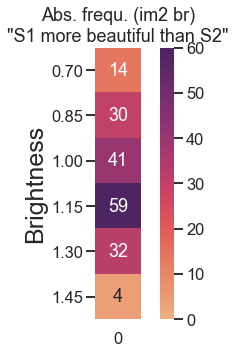

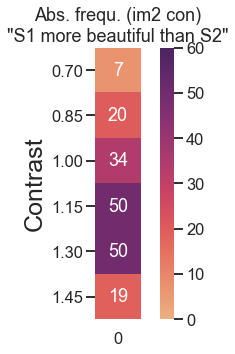

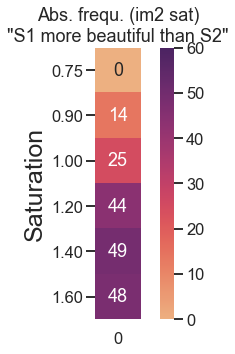

In [24]:
names = ["Iliya", "Chris", "Matti", "Bozhidar"]
images = ["im2"]
variables = ["br", "con", "sat"]


for image in images:
    
    #fig, ax = plt.subplots(ncols = 3, sharey = True, constrained_layout = True)
    #fig.set_figwidth(13.5)
    #fig.set_figheight(3.5)
    
    for variable in variables:

        observations = np.array( [[np.nan, 0, 0, 0, 0, 0],
                                      [0, np.nan, 0, 0, 0, 0],
                                      [0, 0, np.nan, 0, 0, 0],
                                      [0, 0, 0, np.nan, 0, 0],
                                      [0, 0, 0, 0, np.nan, 0],
                                      [0, 0, 0, 0, 0, np.nan]])
        
        for name in names:
            for versuch in range (3):
                
                f = open('data/' + name + '_ordinal_' + image + '_' + variable + '_' + str(versuch) + '.csv')
                
                csv_f = csv.reader(f)

                for row in csv_f:

                    if(row != []):

                        if(row[0] == '0'):
                            x = int(row[1]) - 1
                            y = int(row[2]) - 1
                            observations[x][y] += 1

                        if(row[0] == '1'):
                            x = int(row[1]) - 1
                            y = int(row[2]) - 1
                            observations[y][x] += 1

                f.close
        
        # Heatmap
        sns.set_style('whitegrid')
        sns.set_context('talk')

        # absolute numbers
        matrix = [[0],
                  [0],
                  [0],
                  [0],
                  [0],
                  [0]]
        
        for i in range (6):
            for j in range (6):
                if i != j:
                    matrix[i][0] += observations[i][j]
        
        f = plt.figure(figsize=(7, 5))

        # Parametern und Texten anpassen !
        if(variable == 'br'):
            ax1 = sns.heatmap(matrix, square = True, vmin = 0, vmax = 60, cmap = "flare", annot = True)
            ax1.tick_params(left = True)
            ax1.set_yticklabels(['0.70', '0.85', '1.00', '1.15', '1.30', '1.45'], rotation = 0)
            ax1.set_ylabel('Brightness', fontsize = 25)
            ax1.set_title('Abs. frequ. (' + image + ' ' + variable + ')\n"S1 more beautiful than S2"')
                 
        if (variable == 'con'):
            ax2 = sns.heatmap(matrix, square = True, vmin = 0, vmax = 60, cmap = "flare", annot = True)
            ax2.tick_params(left = True)
            ax2.set_yticklabels(['0.70', '0.85', '1.00', '1.15', '1.30', '1.45'], rotation = 0)
            ax2.set_ylabel('Contrast', fontsize = 25)
            ax2.set_title('Abs. frequ. (' + image + ' ' + variable + ')\n"S1 more beautiful than S2"')
                
        if (variable == 'sat'):
            ax3 = sns.heatmap(matrix, square = True, vmin = 0, vmax = 60, cmap = "flare", annot = True)
            ax3.tick_params(left = True)
            ax3.set_yticklabels(['0.75', '0.90', '1.00', '1.20', '1.40', '1.60'], rotation = 0)
            ax3.set_ylabel('Saturation', fontsize = 25)
            ax3.set_title('Abs. frequ. (' + image + ' ' + variable + ')\n"S1 more beautiful than S2"')
        
    #f.savefig(image + '_' + variable +'_heatmap_absolut.pdf')

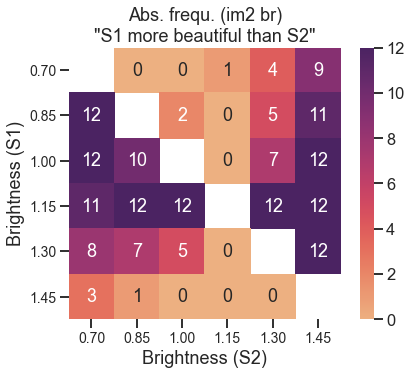

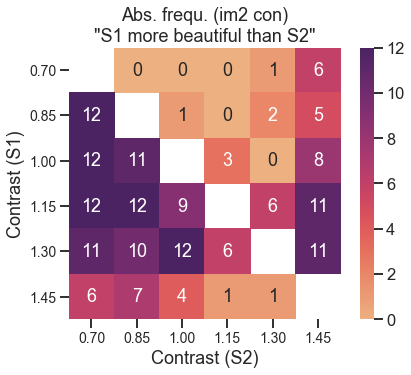

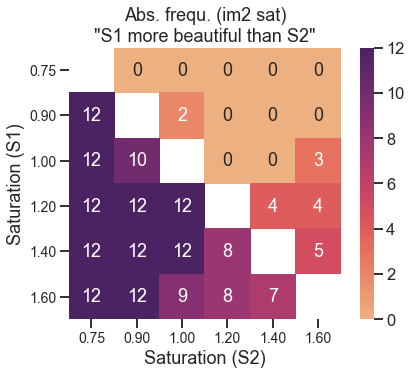

In [25]:
names = ["Iliya", "Chris", "Matti", "Bozhidar"]
images = ["im2"]
variables = ["br", "con", "sat"]


for image in images:
    
    #fig, ax = plt.subplots(ncols = 3, sharey = True, constrained_layout = True)
    #fig.set_figwidth(13.5)
    
    for variable in variables:

        observations = np.array( [[np.nan, 0, 0, 0, 0, 0],
                                      [0, np.nan, 0, 0, 0, 0],
                                      [0, 0, np.nan, 0, 0, 0],
                                      [0, 0, 0, np.nan, 0, 0],
                                      [0, 0, 0, 0, np.nan, 0],
                                      [0, 0, 0, 0, 0, np.nan]])
        
        for name in names:
            for versuch in range (3):
                
                f = open('data/' + name + '_ordinal_' + image + '_' + variable + '_' + str(versuch) + '.csv')
                
                csv_f = csv.reader(f)

                for row in csv_f:

                    if(row != []):

                        if(row[0] == '0'):
                            x = int(row[1]) - 1
                            y = int(row[2]) - 1
                            observations[x][y] += 1

                        if(row[0] == '1'):
                            x = int(row[1]) - 1
                            y = int(row[2]) - 1
                            observations[y][x] += 1

                f.close
        
        # Heatmap
        sns.set_style('whitegrid')
        sns.set_context('talk')

        # absolute numbers
        matrix = observations
        
        f = plt.figure(figsize=(7, 5))

        # Parametern und Texten anpassen !
        if(variable == 'br'):
            ax1 = sns.heatmap(matrix, square = True, vmin = 0, vmax = 12, cmap = "flare", annot = True)
            ax1.tick_params(left = True, bottom = True)
            ax1.set_xticklabels(['0.70', '0.85', '1.00', '1.15', '1.30', '1.45'], fontsize = 14)
            ax1.set_yticklabels(['0.70', '0.85', '1.00', '1.15', '1.30', '1.45'], rotation = 0, fontsize = 14)
            ax1.set_xlabel('Brightness (S2)')
            ax1.set_ylabel('Brightness (S1)')
            ax1.set_title('Abs. frequ. (' + image + ' ' + variable + ')\n"S1 more beautiful than S2"')
                
                    
        if (variable == 'con'):
            ax2 = sns.heatmap(matrix, square = True, vmin = 0, vmax = 12, cmap = "flare", annot = True)
            ax2.tick_params(left = True, bottom = True)
            ax2.set_xticklabels(['0.70', '0.85', '1.00', '1.15', '1.30', '1.45'], fontsize = 14)
            ax2.set_yticklabels(['0.70', '0.85', '1.00', '1.15', '1.30', '1.45'], rotation = 0, fontsize = 14)
            ax2.set_xlabel('Contrast (S2)')
            ax2.set_ylabel('Contrast (S1)')
            ax2.set_title('Abs. frequ. (' + image + ' ' + variable + ')\n"S1 more beautiful than S2"')
                
                    
        if (variable == 'sat'):
            ax3 = sns.heatmap(matrix, square = True, vmin = 0, vmax = 12, cmap = "flare", annot = True)
            ax3.tick_params(left = True, bottom = True)
            ax3.set_xticklabels(['0.75', '0.90', '1.00', '1.20', '1.40', '1.60'], fontsize = 14)
            ax3.set_yticklabels(['0.75', '0.90', '1.00', '1.20', '1.40', '1.60'], rotation = 0, fontsize = 14)
            ax3.set_xlabel('Saturation (S2)')
            ax3.set_ylabel('Saturation (S1)')
            ax3.set_title('Abs. frequ. (' + image + ' ' + variable + ')\n"S1 more beautiful than S2"')
            
    plt.show()
        
    #f.savefig(image + '_' + variable +'_heatmap_absolut.pdf')

### Teil 2 Skalenbewertung
Wir haben die Ergebnisse von der Skalenbewertung mit Balkendiagrammen für die Nominalenskalen (1-10, 1-50) und mit Heatmaps für die Ordinal- und Schulnotenskalen dargestellt. Bei den Nominalenskalen haben wir zuerst für jede Versuchperson und dann für die ganze Gruppe ein Balkendiagramm für ein Stimuli. Mit den Heatmaps für die Ordinal- und Schulnotenskalen haben wir es nur für die ganze Gruppe dargestellt, da sondern man die Unterschiede nur für eine Versuchperson nicht erkennen kann.


### Nominalskalen (1-10) und (1-50) für jede Versuchsperson




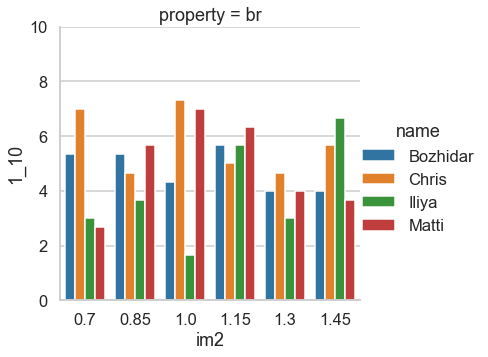

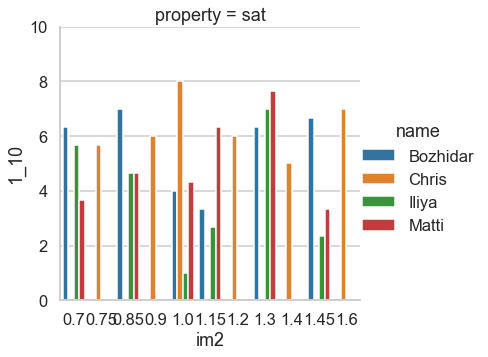

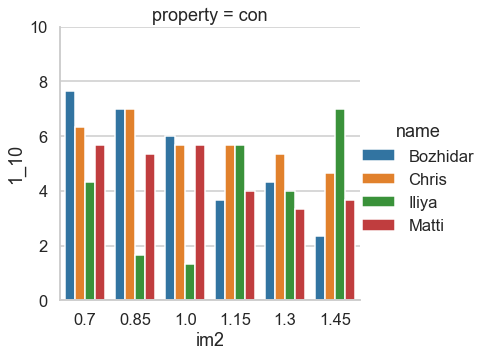

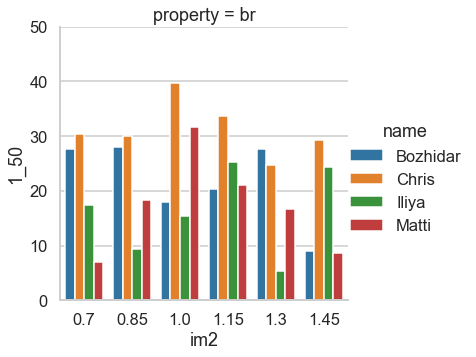

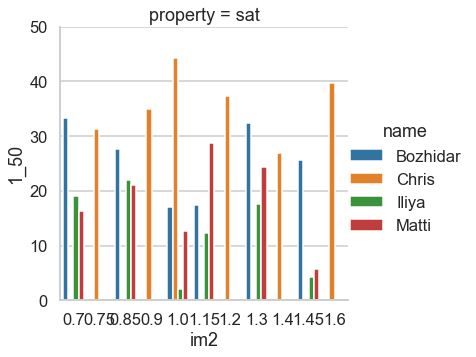

...

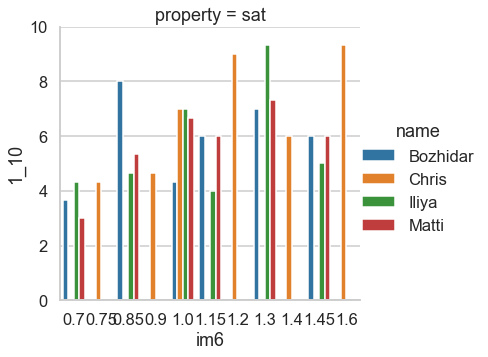

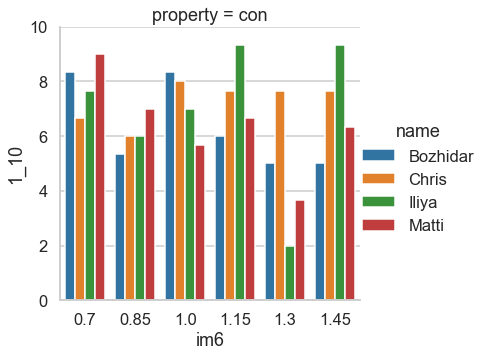

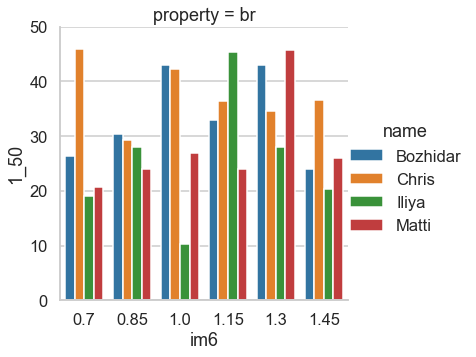

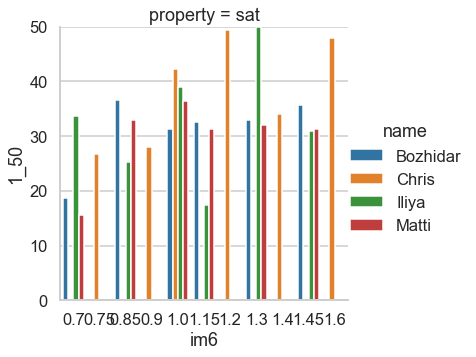

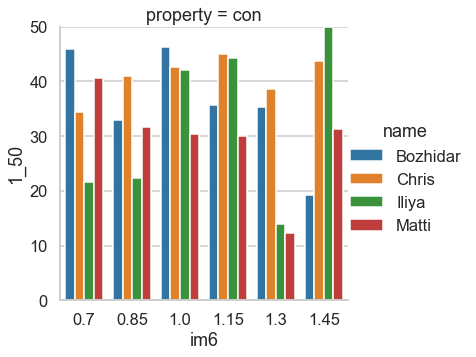

In [26]:
for image in ["im2","im6"]:
    for scale in ["1_10","1_50"]:
        for ax_nr, prop in enumerate(["br", "sat", "con"]):
            df_subset = df[(df.scale == scale) & (df.image == image) & (df.property == prop)]
            
            if prop == "sat":
                foo1 = df_subset.explode('rating')
                foo1['rating'] = foo1['rating'].astype('float')
                g =sns.catplot(x="variation", y="rating", hue='name',col='property',\
                data=foo1,ci=None,kind='bar')
                g.set_xticklabels(rotation=0)
                if scale == "1_10":
                    (g.set_axis_labels(image,scale).
                    set(ylim=(0,10)))
                else:
                    (g.set_axis_labels(image,scale).
                    set(ylim=(0,50)))
            
            if prop == "br" or prop == "con":
                foo1 = df_subset.explode('rating')
                foo1['rating'] = foo1['rating'].astype('float')
                g =sns.catplot(x="variation", y="rating", hue='name',col='property',\
                data=foo1,ci=None,kind='bar')
                g.set_xticklabels(rotation=0)
                if scale == "1_10":
                    (g.set_axis_labels(image,scale).
                    set(ylim=(0,10)))
                else:
                    (g.set_axis_labels(image,scale).
                    set(ylim=(0,50)))
            

### Nominalskalen (1-10) und (1-50) für die ganze Versuchsgruppe

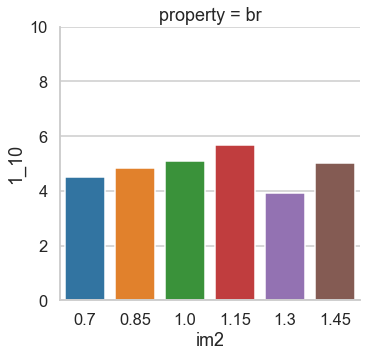

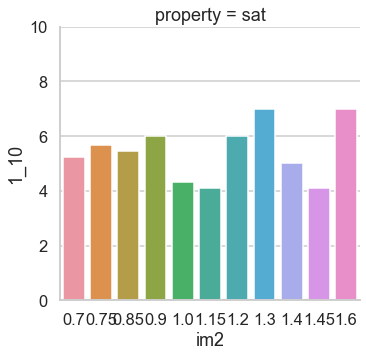

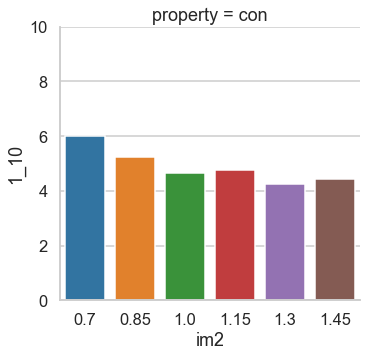

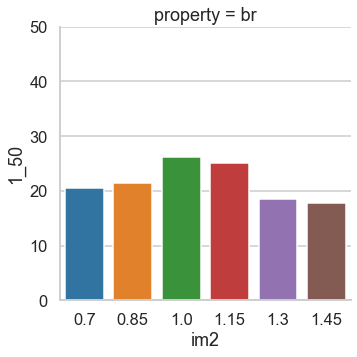

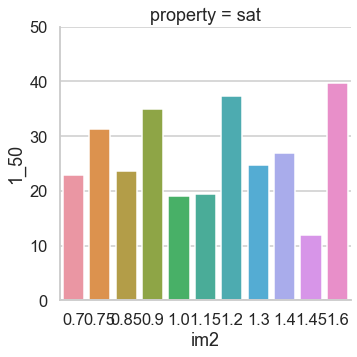

...

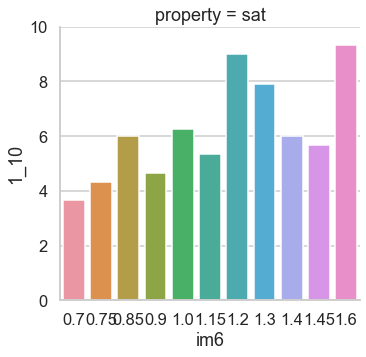

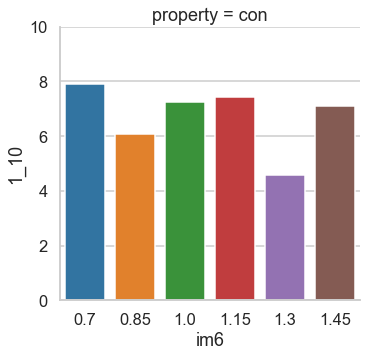

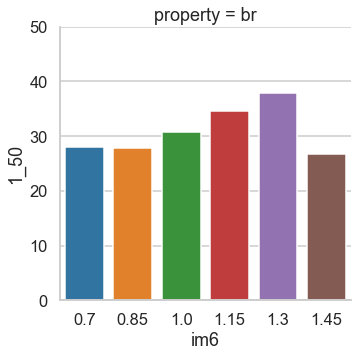

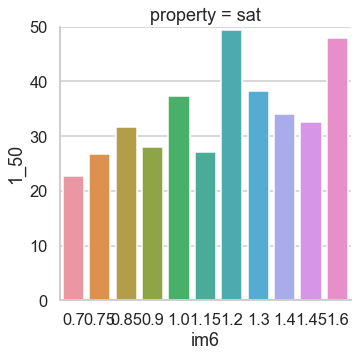

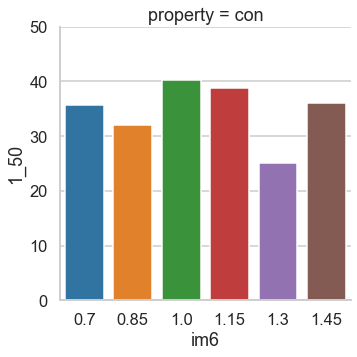

In [27]:
for image in ["im2", "im6"]:
    for scale in ["1_10", "1_50"]:
        for ax_nr, prop in enumerate(["br", "sat", "con"]):
            df_subset = df[(df.scale == scale) & (df.image == image) & (df.property == prop)]
            
            if prop == "sat":
                foo1 = df_subset.explode('rating')
                foo1['rating'] = foo1['rating'].astype('float')
                g1 = foo1.groupby((['property', 'variation']))['rating'].mean().reset_index()
                ax[ax_nr] =sns.catplot(x="variation", y="rating",col='property',\
                 data=g1,ci=None,kind='bar')
                
                ax[ax_nr].set_xticklabels(rotation=0)
                if scale == "1_10":
                    (ax[ax_nr].set_axis_labels(image,scale).
                    set(ylim=(0,10)))
                else: 
                    (ax[ax_nr].set_axis_labels(image,scale).
                    set(ylim=(0,50)))
                     
            if prop == "br" or prop == "con":
                foo1 = df_subset.explode('rating')
                foo1['rating'] = foo1['rating'].astype('float')
                g1 = foo1.groupby((['property', 'variation']))['rating'].mean().reset_index()
                ax[ax_nr] =sns.catplot(x="variation", y="rating",col='property',\
                 data=g1,ci=None,kind='bar')
                ax[ax_nr].set_xticklabels(rotation=0)
                if scale == "1_10":
                    (ax[ax_nr].set_axis_labels(image,scale).
                    set(ylim=(0,10)))
                else: 
                    (ax[ax_nr].set_axis_labels(image,scale).
                    set(ylim=(0,50)))
            

### Ordinal- und Schulnotenskala für die ganze Versuchsgruppe

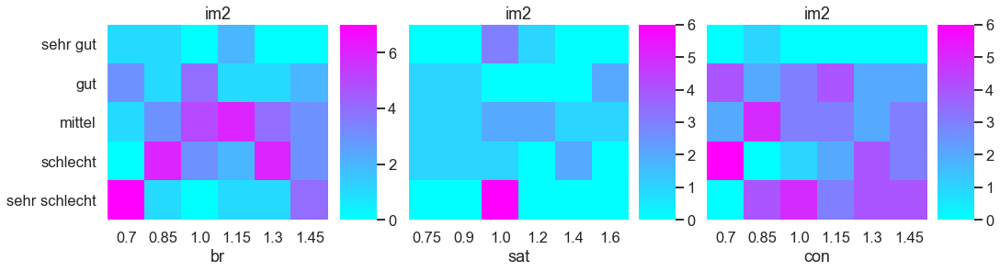

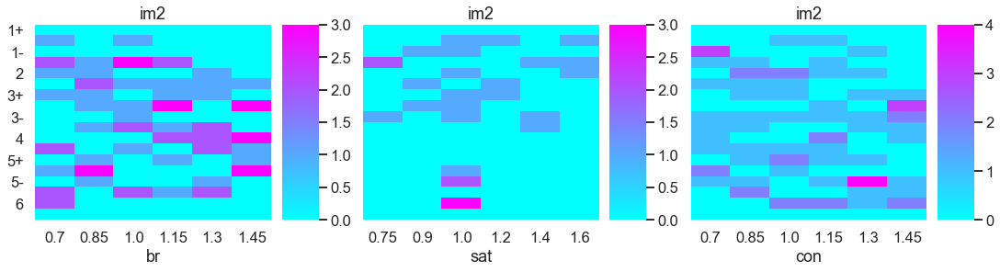

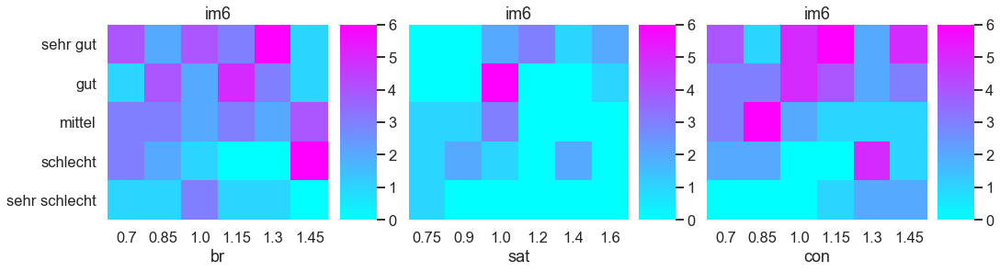

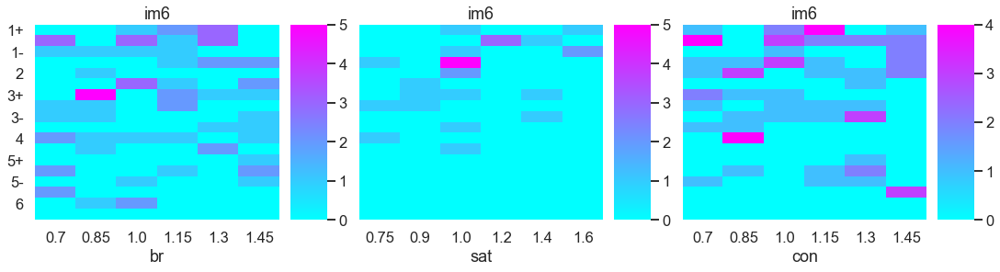

In [28]:
possibleValues = {"words": ["sehr gut", "gut", "mittel", "schlecht", "sehr schlecht"],
                "grades": ['1+', '1', '1-', '2+', '2', '2-', '3+', '3', '3-', '4+', '4', '4-', '5+', '5', '5-', '6+', '6', '6-']}

for image in ["im2", "im6"]:
    for scale in ["words", "grades"]:
        fig, ax = plt.subplots(ncols=3, sharey=True, constrained_layout=True)
        fig.set_figwidth(15)
        for ax_nr, prop in enumerate(["br", "sat", "con"]):
            df_subset = df[(df.scale == scale) & (df.image == image) & (df.property == prop)]
            
            if prop == "sat":
                heatmap_df = pd.DataFrame(columns = [0.75,0.9,1,1.2,1.4,1.6], index = possibleValues[scale])
                for variation in [0.75,0.9,1,1.2,1.4,1.6]:
                    heatmap_df[variation] = df_subset[df_subset.variation == variation].rating.value_counts()
                heatmap_df = heatmap_df.fillna(0)
            
            if prop == "br" or prop == "con":
                heatmap_df = pd.DataFrame(columns = [0.7,0.85,1,1.15,1.3,1.45], index = possibleValues[scale])
                for variation in [0.7,0.85,1,1.15,1.3,1.45]:
                    heatmap_df[variation] = df_subset[df_subset.variation == variation].rating.value_counts()
                heatmap_df = heatmap_df.fillna(0)
            
            g = sns.heatmap(heatmap_df, cmap='cool', ax=ax[ax_nr])
            if ax_nr==0:
                g.set_yticklabels(g.get_yticklabels(), rotation = 0)
            
            ax[ax_nr].set_xlabel(prop)
            ax[ax_nr].set_title(image)

### Zusammenfassung Skalenbewertung

Generell gibt es keine signifikanten Unterschiede zwischen der Bewertung desselben Bildes auf verschiedenen Skalen. Teils gibt es zwar geringe Unterschiede zwischen den einzelnen Skalen, wie Beispiels bei Bild 2, Saturation, jedoch sind diese nicht aussagekräftig genug. Die Bilder selbst wurden aber unterschiedlich bewertet, Bild 6 hat eine um circa 20 % bessere Bewertung als Bild 2. Jedoch bleibt die beste Verstärkung einer Ausprägung nicht zwingend dieselbe. So ist zum Beispiel für Bild 2 der maximal untersuchte Kontrast mit der schlechteste Wert, für Bild 6 jedoch mit der Beste. Demnach ist erkennbar, dass für verschiedene Sonnenuntergänge andere Bearbeitungen notwendig sind, um die wahrgenommene Schönheit zu erhöhen. Es gibt auch kein klar am besten bewertetes Bild bzw. Ausprägung. 

Für die Helligkeit von Bild 2 sind die angenommenen Werte von 1.0 oder 1.15 durch alle Skalen hinweg die Beste. Bei der Saturation dieses Bildes teils bei einigen Graphen einen kleinen Favoriten, den Wert 1.4. Jedoch ist erkennbar, dass der 1.6 Wert danach nicht mehr gut ist. Bei dem Kontrast von Bild 2 gibt es keinen optimalen Wert, aber 0.7 hat durchschnittlich eine leicht bessere Bewertung.

Bei Bild 6 lassen sich etwas mehr optimale und schlechte Veränderungen des Bildes ablesen. Für die Helligkeit bleibt es bei zwei optimalen Werten, jedoch verschieben sich diese um eine Abstufung nach oben im Vergleich zu Bild 2 auf 1.15-1.3. Die Bewertung der Saturation sieht im Gegensatz zu Bild 2 sehr viel anders aus und viele Werte sind gleich gut bewertet, sticht der Wert 1.4 leicht heraus. Zuletzt kommt noch der Kontrast von Bild 6. Dieser ist etwas ungewöhnlich, da man normalerweise eine grobe gaußsche Verteilung erwarten würde. Es gibt aber vier circa gleich gute Werte und zwei Werte die klar schlechter bewertet wurden, 0.85 und besonders 1.3. Vor allem, sind von den vier Werten die beiden Ränder etwas besser bewertet worden. 
Wir gehen noch etwas genauer auf einzelne Graphen ein, besonders auch auf die, auf denen die einzelnen Bewertungen aufgelistet wurden.  Zum Beispiel ist für manche Personen eine Veränderung einer Ausprägung mit die beste, für manche aber die komplett am schlechtesten bewerte. Das ist der Fall bei der Saturationsanalyse von Bild 2 auf der 1-10 Skala bei 1.0. Für grün ist es der schlechteste Wert überhaupt, für gelb hingegen mit der am besten bewertete.  Selten verändert sich auch die Bewertung einer einzelnen Personen zwischen zwei Skalen komplett, wie es vor allem bei dem Kontrast bei Bild 2 zu sehen ist. Bei manchen Personen hat die Skala jedoch auch einen Unterschied gemacht. Blau bewertet durchschnittlich die 1-10 Skala um ca. 20% besser, bei manchen Ausprägungen mehr und bei manchen weniger. Generell gibt es auch andere Unterschiede zwischen den Skalen, so wird die Skala mit sehr gut – sehr schlecht öfters komplett gut oder schlecht bewertet als die anderen. Das kann aber an dem kleineren Wertebereich liegen. In der Skala der Schulnoten wurde für Bild 2 die „Bestnote“ nicht einmal verteilt, die schlechteste jedoch häufiger. Andersherum ist es bei Bild 6, dort wurde die Note 6 selten verteilt, die Note 1+ aber häufiger. Um nochmal die Anomalie von Bild 6, Kontrast mehr auszuwerten, haben zwei Personen eine gute Bewertung für dieses Bild abgegeben, die anderen Beiden jedoch eine eher schlechte. Das kann auch eventuell daherkommen, dass man sich einen Favoriten nimmt und weiß, dass dieser noch nicht erreicht wurde und deswegen das Bild, was ähnlich dazu ist, schlechter bewertet. Ein gemeinsamer Trend zwischen beiden Bildern ist, dass eine erhöhte Saturation um 1.4 das Bild am besten aussehen lässt. Generell kann noch gesagt werden, dass einige Personen eher höher bewerten, andere eher geringer. 

**Probleme:** Manche Skalen bestehen nur aus Wörtern, manche aus Zahlen was teils die Auswertung uns etwas erschwert hat. Bei einer erneuten Untersuchung würden wir auch die Reihenfolge des Auftretens der Skalen ändern, da diese bei dem jetzigen Versuch fix war. Dadurch kann es auch zur leicht besseren Bewertung der Skala 1-10 kommen, da diese als erstes abgefragt wurde und durchschnittlich auch leicht besser bewertet wurde. Das kann natürlich auch an anderen Gründen liegen, mit unserer Untersuchung können wir das jedoch nicht belegen.

**Ideen:** Eventuell wäre eine Untersuchung von zwei Skalen interessant, die dieselbe Anzahl an Werten hat, welche jedoch anders beschrieben sind. Also ähnlich zu unserem Versuch einmal mit Wörtern und einmal mit Zahlen, oder mit verschiedenen Wörtern beschriftet. 


## 4. Diskussion

Uns ist klar geworden, dass wir für eine bessere Auswertung mehr Daten benötigen. Einerseits mehr Durchläufe pro Person, andererseits würden mehr Testpersonen es auch erleichtern. Zudem wäre es gut, bei dem 2. Teil des Experiments mehr Bilder in den Vergleich einzubeziehen, nicht nur die zwei. 

Uns ist auch aufgefallen, dass jeder Sonnenuntergang sehr individuell ist. Es gibt viele Faktoren die in die generelle Bewertung einfließen und die sich mit dem Verstärken einer Ausprägung ebenfalls ändern. Dazu gehören:
* Erscheinen von Wolken
* Sichtbarkeit der Sonne
* Höhe der Sonne am Horizont
* Existenz eines Motivs (z.B. Stadt, Wasser)
* Farbe des Sonnenuntergangs

Einige Bilder wurden dann bei der Saturation und Helligkeit so grell, dass es nicht mehr schön war, obwohl es bei den anderen Bildern zu positiven Trends gekommen ist. Das ist auch in der Bewertung dieser Bilder erkennbar.
Bei der nächsten Durchführung eines solchen Versuchs würden wir deswegen die Bilder vorher schon vorher Gruppieren und die Ausprägungen auf die Gruppen anpassen.

Dadurch können wir keine klaren Antworten auf unsere aufgestellten Hypothesen liefern. In einigen Bildern mögen unsere angenommenen Thesen zwar übereinstimmen, jedoch nicht in allen. Von den Hypothesen, die sich auf die Ausprägungen beziehen, sind die auf die Saturation bezogenen am meisten verifizierbar, jedoch können wir aufgrund unserer vorhandenen, geringen Daten keine wirkliche Aussage treffen.


Die Bilder wurden meistens ähnlich bewertet, jedoch ist eine persönliche Präferenz erkennbar. Einige von uns bevorzugen genau Abstufung in einem Bild, ein anderer eine andere. Jedoch auf den Durchschnitt von uns gesehen, lässt sich ein Trend sehen, dass alles sehr ähnlich bewertet wurde.

### Mögliche Probleme

Generell: Man wartet immer auf sein Lieblingsbild und bewertet dieses besser bzw. lässt dieses immer gewinnen. Zudem kennen wir unsere Bilder allgemein sehr gut und wissen schon zuvor welches als nächstes kommen würde und schränken unsere Bewertung dadurch ein.
Teil 2: Man hat immer nur die zwei Bilder gesehen und dadurch mehr zwischen diesen Bildern einzelnd verglichen und nicht alleinstehend nur nach wahrgenommener Ästehtik. Hier würde eine höhere Bilderanzahl auch helfen. Der verwendete Schiebereglerfür die Skala von 1 bis 50 bringt zusätzlich auch kleine Ungenauigkeiten herein. Die Skala ist eher kurz, wurde kleine Veränderungen teils große Auswirkung auf die Bewertung hat.

### Offene Fragen

Gibt es pro Sonnenuntergangsart optimale Ausprägung?

### Referenzen

* Referenz 1
* Referenz 2